In [2]:
import torch

base = 10000
dim = 2048  # Example dimension
inv_freq = 1.0 / (base ** (torch.arange(0, dim, 2).float() / dim))
max_seq_len_cached = 128000  # Example maximum sequence length
t = torch.arange(max_seq_len_cached, dtype=inv_freq.dtype)
freqs = torch.einsum("i,j->ij", t, inv_freq)
freqs, freqs.shape

(tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00],
         [1.0000e+00, 9.9105e-01, 9.8217e-01,  ..., 1.0274e-04, 1.0182e-04,
          1.0090e-04],
         [2.0000e+00, 1.9821e+00, 1.9643e+00,  ..., 2.0547e-04, 2.0363e-04,
          2.0181e-04],
         ...,
         [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
          1.2915e+01],
         [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
          1.2915e+01],
         [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
          1.2916e+01]]),
 torch.Size([128000, 1024]))

In [3]:
freqs[127995:]

tensor([[1.2800e+05, 1.2685e+05, 1.2571e+05,  ..., 1.3150e+01, 1.3032e+01,
         1.2915e+01],
        [1.2800e+05, 1.2685e+05, 1.2571e+05,  ..., 1.3150e+01, 1.3032e+01,
         1.2915e+01],
        [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
         1.2915e+01],
        [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
         1.2915e+01],
        [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
         1.2916e+01]])

In [4]:
freqs[127995] - freqs[128000 - 1]

tensor([-4.0000e+00, -3.9609e+00, -3.9297e+00,  ..., -4.1008e-04,
        -4.0722e-04, -4.0340e-04])

In [5]:
emb = torch.cat((freqs, freqs), dim=-1)
emb, emb.shape

(tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
          0.0000e+00],
         [1.0000e+00, 9.9105e-01, 9.8217e-01,  ..., 1.0274e-04, 1.0182e-04,
          1.0090e-04],
         [2.0000e+00, 1.9821e+00, 1.9643e+00,  ..., 2.0547e-04, 2.0363e-04,
          2.0181e-04],
         ...,
         [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
          1.2915e+01],
         [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
          1.2915e+01],
         [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
          1.2916e+01]]),
 torch.Size([128000, 2048]))

In [6]:
emb[127995:]

tensor([[1.2800e+05, 1.2685e+05, 1.2571e+05,  ..., 1.3150e+01, 1.3032e+01,
         1.2915e+01],
        [1.2800e+05, 1.2685e+05, 1.2571e+05,  ..., 1.3150e+01, 1.3032e+01,
         1.2915e+01],
        [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
         1.2915e+01],
        [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
         1.2915e+01],
        [1.2800e+05, 1.2685e+05, 1.2572e+05,  ..., 1.3150e+01, 1.3032e+01,
         1.2916e+01]])

In [7]:
emb[127995] == emb[128000 - 1]

tensor([False, False, False,  ..., False, False, False])

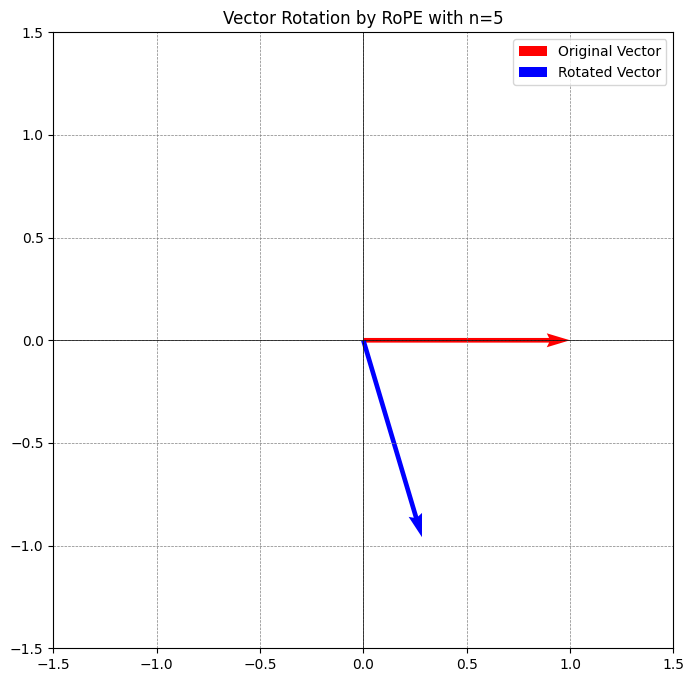

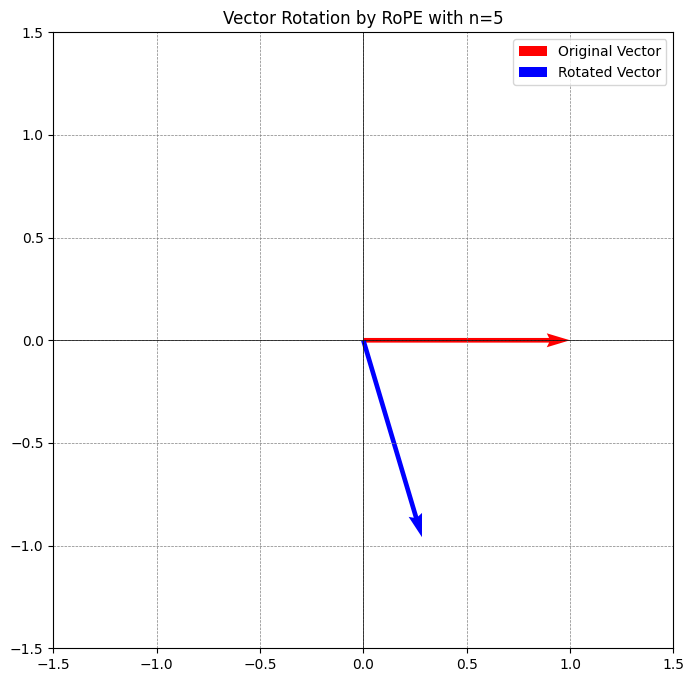

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Function to plot vector rotation using RoPE logic


def plot_vector_rotation_with_rope(d=4, n=1, base=10000):
    theta_values = base ** (-2 * np.arange(d // 2) / d)

    # Select specific i for demonstration
    i = 0  # We will use the first 2 dimensions for visualization
    n_theta_i = n * theta_values[i]

    # Rotation matrix for RoPE
    rotation_matrix = np.array([
        [np.cos(n_theta_i), -np.sin(n_theta_i)],
        [np.sin(n_theta_i), np.cos(n_theta_i)]
    ])

    # Original vector
    vector = np.array([1, 0])  # Example vector along x-axis

    # Rotated vector
    rotated_vector = rotation_matrix @ vector

    # Plot original and rotated vectors
    plt.figure(figsize=(8, 8))
    plt.quiver(0, 0, vector[0], vector[1], angles='xy',
               scale_units='xy', scale=1, color='r', label='Original Vector')
    plt.quiver(0, 0, rotated_vector[0], rotated_vector[1], angles='xy',
               scale_units='xy', scale=1, color='b', label='Rotated Vector')

    plt.xlim(-1.5, 1.5)
    plt.ylim(-1.5, 1.5)
    plt.axhline(0, color='black', linewidth=0.5)
    plt.axvline(0, color='black', linewidth=0.5)
    plt.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.legend()
    plt.title(f'Vector Rotation by RoPE with n={n}')
    plt.show()


# # You can adjust the parameters below to see different results
# plot_vector_rotation_with_rope(d=4, n=10, base=10000)
# plot_vector_rotation_with_rope(d=4, n=5, base=1000)


# Example plot with specific parameters
plot_vector_rotation_with_rope(d=4, n=5, base=10000)
plot_vector_rotation_with_rope(d=4, n=5, base=500000)

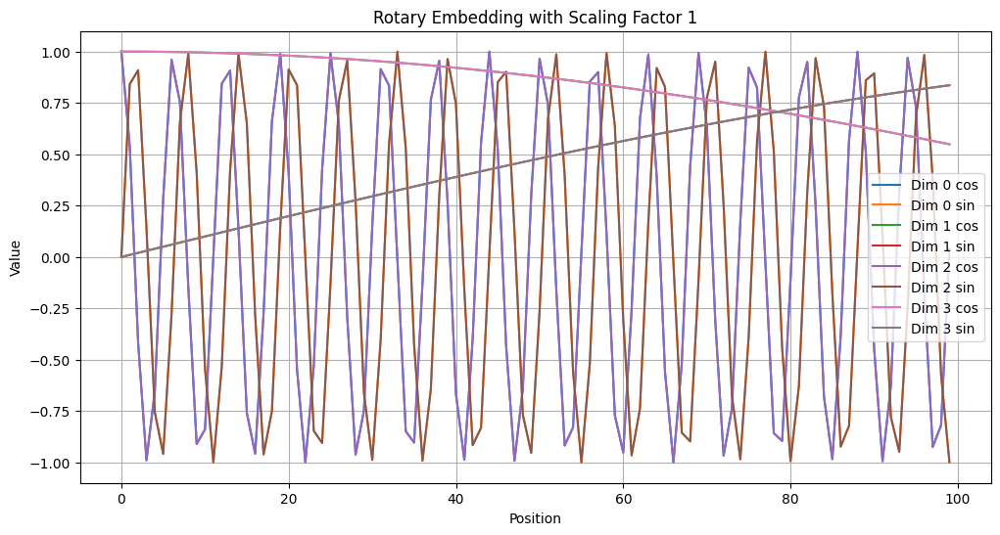

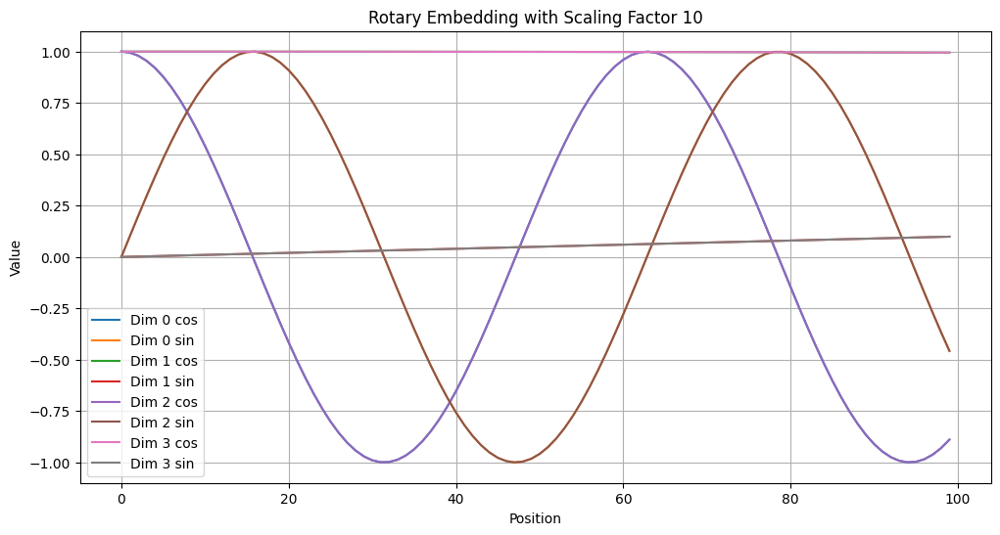

In [9]:
# 当ROPE是linear时
import torch
import numpy as np
import matplotlib.pyplot as plt


def plot_rotary_embedding(scaling_factor, max_seq_len=100, dim=4, base=10000):
    device = 'cpu'
    inv_freq = 1.0 / (base ** (torch.arange(0, dim, 2).float() / dim))
    t = torch.arange(max_seq_len).float()
    t_scaled = t / scaling_factor

    freqs = torch.einsum('i,j->ij', t_scaled, inv_freq)
    emb = torch.cat((freqs, freqs), dim=-1)

    cos_cached = emb.cos()
    sin_cached = emb.sin()

    plt.figure(figsize=(12, 6))
    for i in range(dim):
        plt.plot(cos_cached[:, i].cpu().numpy(), label=f'Dim {i} cos')
        plt.plot(sin_cached[:, i].cpu().numpy(), label=f'Dim {i} sin')
    plt.title(f'Rotary Embedding with Scaling Factor {scaling_factor}')
    plt.xlabel('Position')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()


plot_rotary_embedding(scaling_factor=1)
plot_rotary_embedding(scaling_factor=10)

In [10]:
import torch
import matplotlib.pyplot as plt


class RotaryEmbedding(nn.Module):
    def __init__(self, max_seq_len=100, dim=4, base=10000):
        super(RotaryEmbedding, self).__init__()
        self.max_seq_len = max_seq_len
        self.dim = dim
        self.base = base

        inv_freq = 1.0 / \
            (self.base ** (torch.arange(0, self.dim, 2).float() / self.dim))
        self.register_buffer("inv_freq", inv_freq, persistent=False)

    def forward(self, scaling_factor):
        if self.max_seq_len > self.max_seq_len:
            self.base = self.base * (
                (scaling_factor * self.max_seq_len /
                 self.max_seq_len) - (scaling_factor - 1)
            ) ** (self.dim / (self.dim - 2))
            self.inv_freq = 1.0 / \
                (self.base ** (torch.arange(0, self.dim, 2).float() / self.dim))

        t = torch.arange(self.max_seq_len).float()
        freqs = torch.einsum('i,j->ij', t, self.inv_freq)
        emb = torch.cat((freqs, freqs), dim=-1)

        self.register_buffer("cos_cached", emb.cos(), persistent=False)
        self.register_buffer("sin_cached", emb.sin(), persistent=False)

        return self.cos_cached, self.sin_cached

    def plot_rotary_embedding(self, scaling_factor):
        cos_cached, sin_cached = self(scaling_factor)

        plt.figure(figsize=(12, 6))
        for i in range(self.dim):
            plt.plot(cos_cached[:, i].cpu().numpy(), label=f'Dim {i} cos')
            plt.plot(sin_cached[:, i].cpu().numpy(), label=f'Dim {i} sin')
        plt.title(f'Rotary Embedding with Scaling Factor {scaling_factor}')
        plt.xlabel('Position')
        plt.ylabel('Value')
        plt.legend()
        plt.grid(True)
        plt.show()


# Usage
model = RotaryEmbedding()
model.plot_rotary_embedding(scaling_factor=1)
model.plot_rotary_embedding(scaling_factor=10)

NameError: name 'nn' is not defined

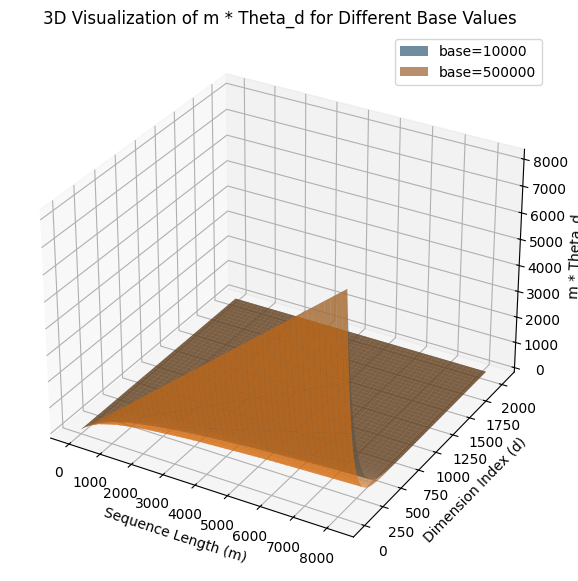

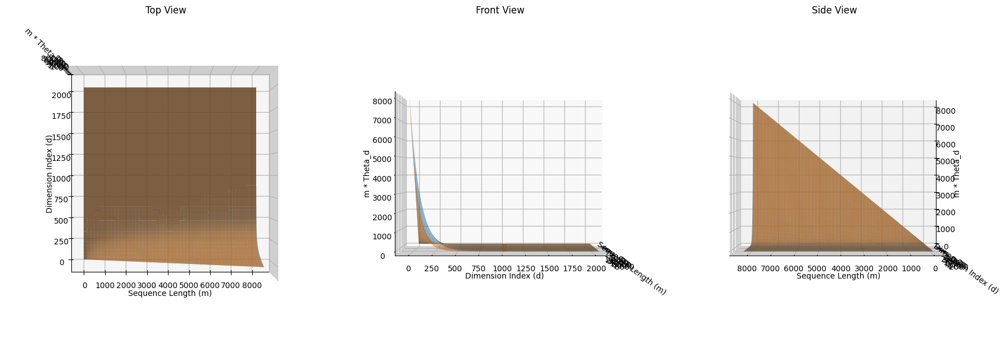

In [ ]:
import torch
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
base = 10000
D = 2048
d = torch.arange(0, D, 2, dtype=torch.float)  # 浮点数类型
m = torch.arange(1, 8192 + 1, dtype=torch.float)

# 不同的base值
bases = [10000, 500000]

# 创建图形和3D坐标轴
fig = plt.figure(figsize=(14, 7))
ax = fig.add_subplot(111, projection='3d')

for base in bases:
    theta_d = base ** (-2 * d / D)
    m_theta_d = m[:, None] * theta_d[None, :]  # 广播乘法

    # 使用meshgrid来生成三维图的网格数据
    M, D_grid = torch.meshgrid(m, d, indexing='ij')
    ax.plot_surface(M.numpy(), D_grid.numpy(), m_theta_d.numpy(),
                    alpha=0.6, label=f'base={base}')

    # # 由于数据量可能很大，我们可以选择绘制部分数据以避免图形过于拥挤
    # # 这里我们每隔100个m值取一个，每隔10个d值取一个
    # skip = (slice(None, None, 100), slice(None, None, 10))
    # ax.plot_surface(M[skip].numpy(), D_grid[skip].numpy(), m_theta_d[skip].numpy(), label=f'base={base}', alpha=0.6)

ax.set_xlabel('Sequence Length (m)')
ax.set_ylabel('Dimension Index (d)')
ax.set_zlabel('m * Theta_d')
ax.set_title('3D Visualization of m * Theta_d for Different Base Values')
plt.legend()
plt.show()

# 创建图形和3D坐标轴
fig = plt.figure(figsize=(18, 6))

# 视角设置，元组 (elev, azim) 分别为仰角和方位角
views = [(90, -90), (0, 0), (0, 90)]
titles = ['Top View', 'Front View', 'Side View']

for idx, view in enumerate(views):
    ax = fig.add_subplot(1, 3, idx+1, projection='3d')
    for base in bases:
        theta_d = base ** (-2 * d / D)
        m_theta_d = m[:, None] * theta_d[None, :]  # 广播乘法

        # 使用meshgrid来生成三维图的网格数据
        M, D_grid = torch.meshgrid(m, d, indexing='ij')
        surf = ax.plot_surface(M.numpy(), D_grid.numpy(
        ), m_theta_d.numpy(), alpha=0.6, label=f'base={base}')

        # # 下采样，避免图形过于拥挤
        # skip = (slice(None, None, 100), slice(None, None, 10))
        # surf = ax.plot_surface(M[skip].numpy(), D_grid[skip].numpy(), m_theta_d[skip].numpy(), label=f'base={base}', alpha=0.6)

        # 视角调整
        ax.view_init(*view)
        ax.set_title(titles[idx])

    ax.set_xlabel('Sequence Length (m)')
    ax.set_ylabel('Dimension Index (d)')
    ax.set_zlabel('m * Theta_d')

plt.tight_layout()
plt.show()

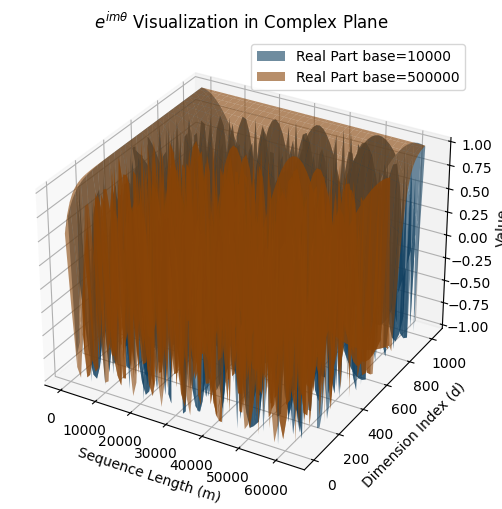

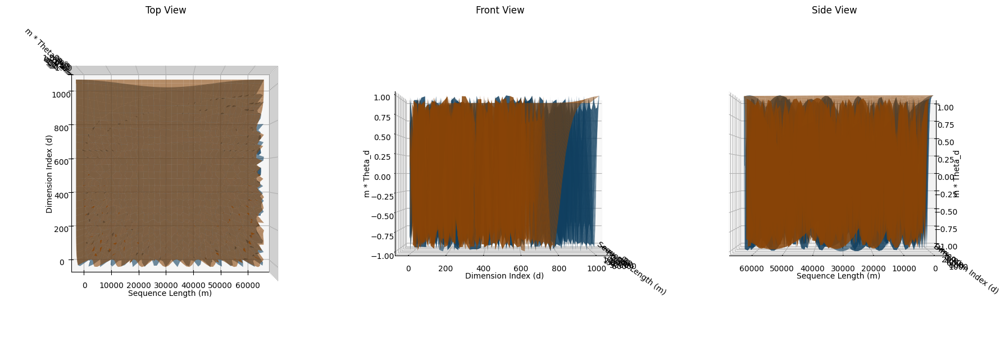

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
base = 10000
D = 2048
d = torch.arange(1, D//2 + 1, dtype=torch.float)  # 浮点数类型
m = torch.arange(1, 128000//2 + 1, dtype=torch.float)
# 不同的base值
bases = [10000, 500000]
# 创建图形和3D坐标轴
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

for base in bases:
    theta_d = base ** (-2 * d / D)
    m_theta_d = m[:, None] * theta_d[None, :]  # 广播乘法
    # 计算 e^(imθ)
    exp_imag_theta_d = torch.exp(1j * m_theta_d)

    # 提取实部和虚部
    real_part = exp_imag_theta_d.real
    imag_part = exp_imag_theta_d.imag
    # 使用meshgrid来生成三维图的网格数据
    M, D_grid = torch.meshgrid(m, d, indexing='ij')
    # 由于数据量可能很大，我们可以选择绘制部分数据以避免图形过于拥挤
    # 这里我们每隔1000个m值取一个，每隔20个d值取一个
    skip = (slice(None, None, 1000), slice(None, None, 20))
    ax.plot_surface(M[skip].numpy(), D_grid[skip].numpy(
    ), real_part[skip].numpy(), label=f'Real Part base={base}', alpha=0.6)


ax.set_xlabel('Sequence Length (m)')
ax.set_ylabel('Dimension Index (d)')
ax.set_zlabel('Value')
ax.set_title(r'$e^{im\theta}$ Visualization in Complex Plane')
plt.legend()
plt.show()
# 创建图形和3D坐标轴
fig = plt.figure(figsize=(18, 6))

# 视角设置，元组 (elev, azim) 分别为仰角和方位角
views = [(90, -90), (0, 0), (0, 90)]
titles = ['Top View', 'Front View', 'Side View']

for idx, view in enumerate(views):
    ax = fig.add_subplot(1, 3, idx+1, projection='3d')
    for base in bases:
        theta_d = base ** (-2 * d / D)
        m_theta_d = m[:, None] * theta_d[None, :]  # 广播乘法
        exp_imag_theta_d = torch.exp(1j * m_theta_d)
        # 提取实部和虚部
        real_part = exp_imag_theta_d.real
        imag_part = exp_imag_theta_d.imag

        # 使用meshgrid来生成三维图的网格数据
        M, D_grid = torch.meshgrid(m, d, indexing='ij')
        # surf = ax.plot_surface(M.numpy(), D_grid.numpy(), real_part.numpy(), alpha=0.6, label=f'base={base}')
        skip = (slice(None, None, 1000), slice(None, None, 20))
        surf = ax.plot_surface(M[skip].numpy(), D_grid[skip].numpy(
        ), real_part[skip].numpy(), label=f'Real Part base={base}', alpha=0.6)

        # 视角调整
        ax.view_init(*view)
        ax.set_title(titles[idx])

    ax.set_xlabel('Sequence Length (m)')
    ax.set_ylabel('Dimension Index (d)')
    ax.set_zlabel('m * Theta_d')

plt.tight_layout()
plt.show()

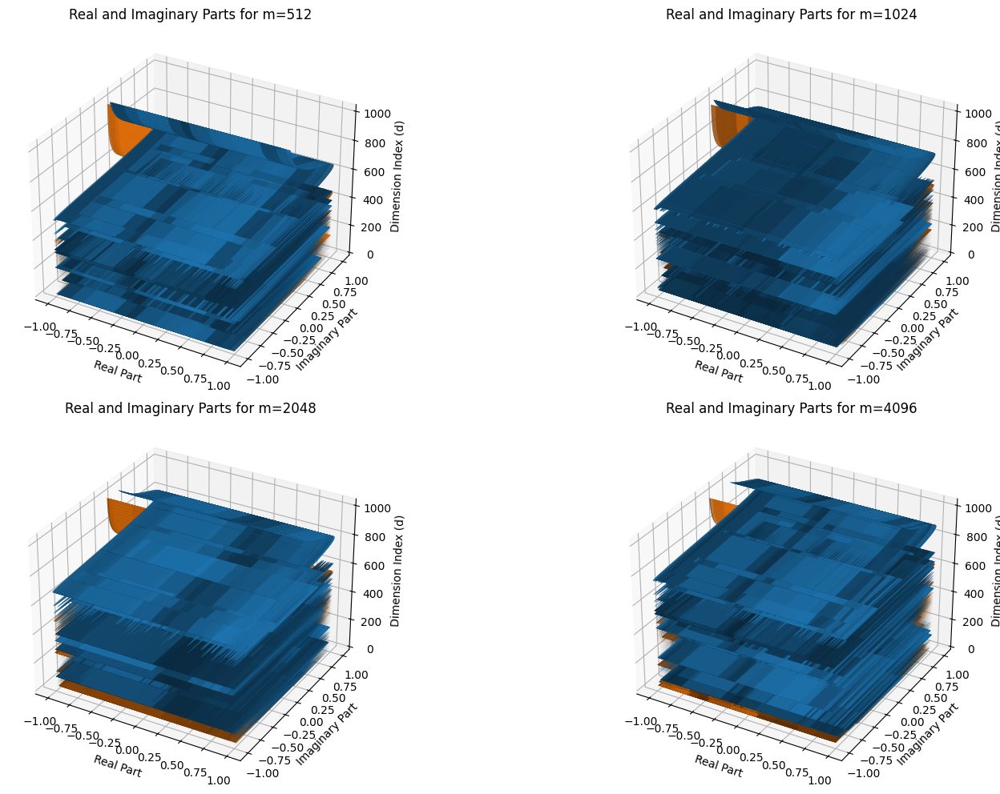

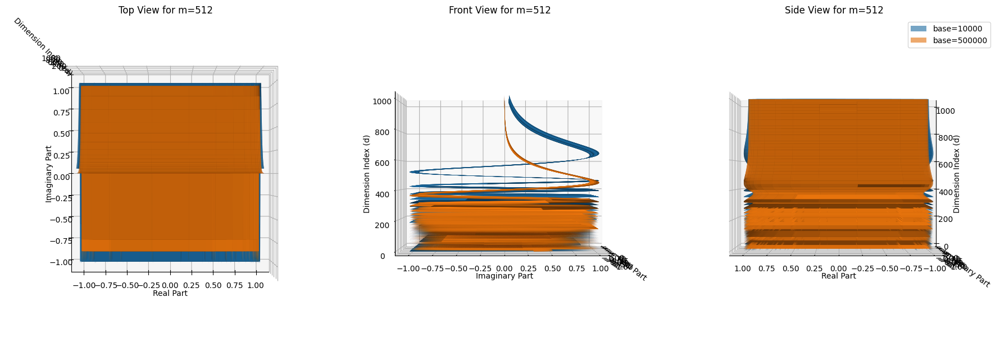

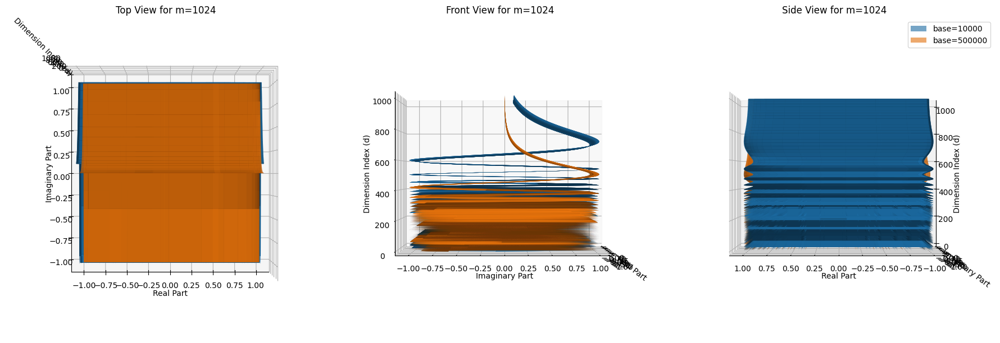

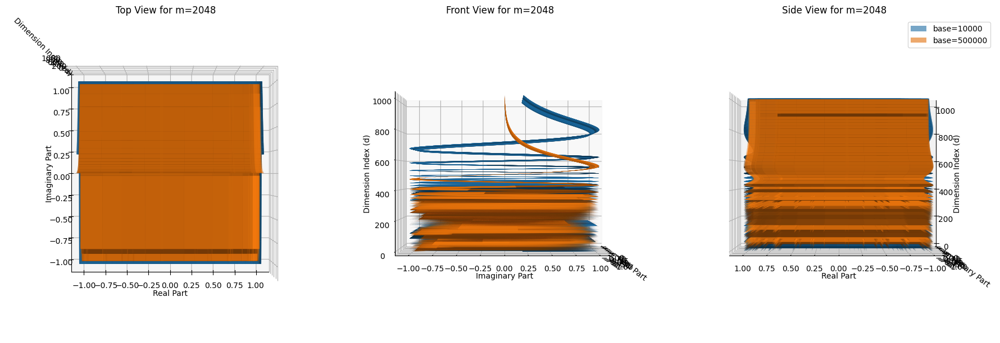

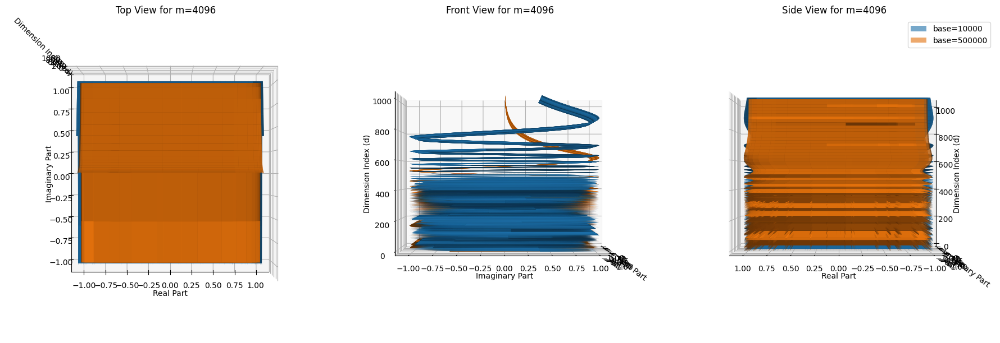

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
base = 10000
D = 2048
d = torch.arange(1, D//2 + 1, dtype=torch.float)  # 浮点数类型
m_values = [512, 1024, 2048, 4096]  # 特定的m值
# 不同的base值
bases = [10000, 500000]
# 创建图形和3D坐标轴
fig = plt.figure(figsize=(18, 10))

# 每个 m 值一个图
for i, m in enumerate(m_values):
    ax = fig.add_subplot(2, 2, i+1, projection='3d')
    for base in bases:
        theta_d = base ** (-2 * d / D)
        m_theta_d = m * theta_d  # 不需要广播，因为m是标量
        # 计算 e^(imθ)
        exp_imag_theta_d = torch.exp(1j * m_theta_d)

        # 提取实部和虚部
        real_part = exp_imag_theta_d.real
        imag_part = exp_imag_theta_d.imag

        # 使用meshgrid来生成三维图的网格数据
        D_grid, Real_grid = torch.meshgrid(d, real_part, indexing='ij')
        Imag_grid, _ = torch.meshgrid(imag_part, d, indexing='ij')

        # 绘制实部和虚部
        ax.plot_surface(Real_grid.numpy(), Imag_grid.numpy(),
                        D_grid.numpy(), label=f'base={base}', alpha=0.6)

    ax.set_zlabel('Dimension Index (d)')
    ax.set_xlabel('Real Part')
    ax.set_ylabel('Imaginary Part')
    ax.set_title(f'Real and Imaginary Parts for m={m}')

plt.tight_layout()
plt.show()
# 视角设置，元组 (elev, azim) 分别为仰角和方位角
views = [(90, -90), (0, 0), (0, 90)]
titles = ['Top View', 'Front View', 'Side View']

# 为每个m值绘制三视图
for m in m_values:
    fig = plt.figure(figsize=(18, 6))
    for i, view in enumerate(views):
        ax = fig.add_subplot(1, 3, i+1, projection='3d')
        for base in bases:
            theta_d = base ** (-2 * d / D)
            m_theta_d = m * theta_d  # 不需要广播，因为m是标量
            # 计算 e^(imθ)
            exp_imag_theta_d = torch.exp(1j * m_theta_d)

            # 提取实部和虚部
            real_part = exp_imag_theta_d.real
            imag_part = exp_imag_theta_d.imag

            # 使用meshgrid来生成三维图的网格数据
            D_grid, Real_grid = torch.meshgrid(d, real_part, indexing='ij')
            Imag_grid, _ = torch.meshgrid(imag_part, d, indexing='ij')

            # 绘制实部和虚部
            ax.plot_surface(Real_grid.numpy(), Imag_grid.numpy(),
                            D_grid.numpy(),  label=f'base={base}', alpha=0.6)

        # 视角调整
        ax.view_init(*view)
        ax.set_zlabel('Dimension Index (d)')
        ax.set_xlabel('Real Part')
        ax.set_ylabel('Imaginary Part')
        ax.set_title(f'{titles[i]} for m={m}')

    plt.legend()
    plt.tight_layout()
    plt.show()

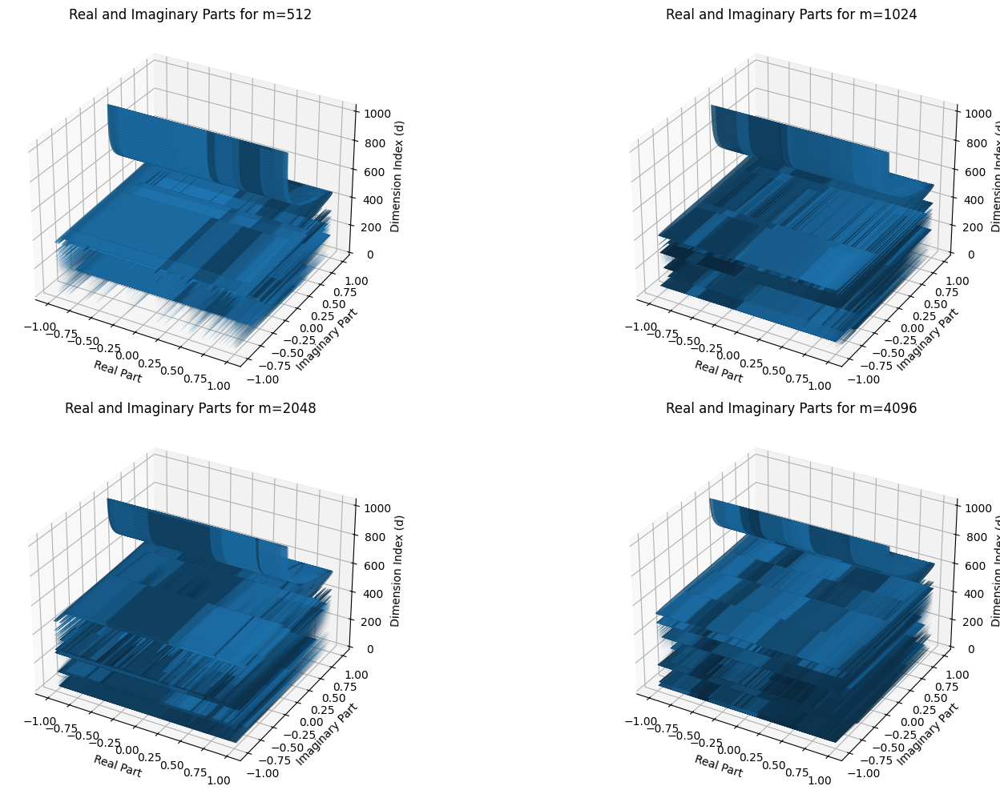

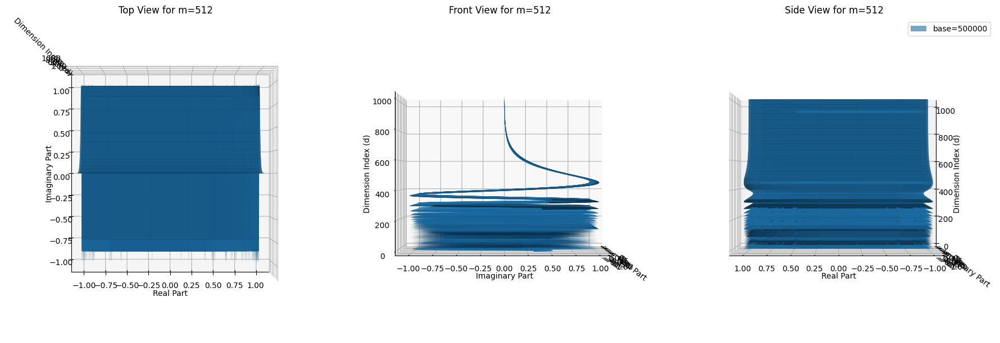

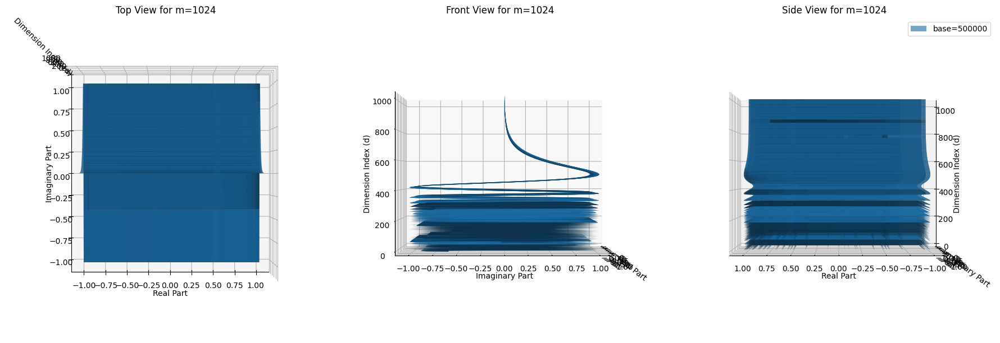

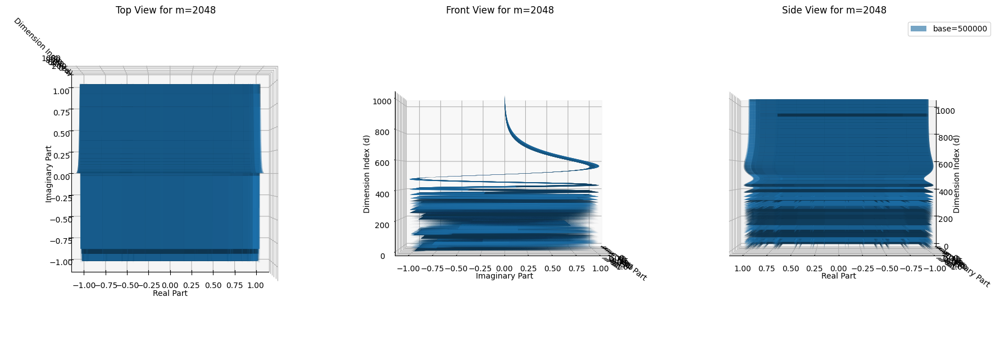

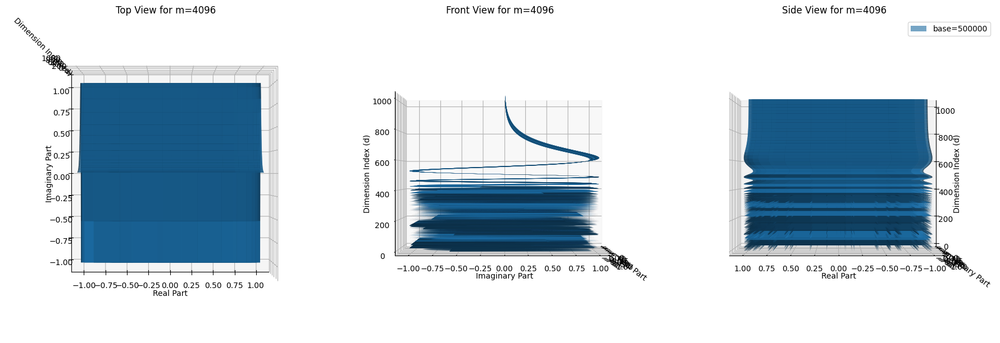

In [11]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
base = 10000
D = 2048
d = torch.arange(1, D//2 + 1, dtype=torch.float)  # 浮点数类型
m_values = [512, 1024, 2048, 4096]  # 特定的m值
# 不同的base值
bases = [500000]
# 创建图形和3D坐标轴
fig = plt.figure(figsize=(18, 10))

# 每个 m 值一个图
for i, m in enumerate(m_values):
    ax = fig.add_subplot(2, 2, i+1, projection='3d')
    for base in bases:
        theta_d = base ** (-2 * d / D)
        m_theta_d = m * theta_d  # 不需要广播，因为m是标量
        # 计算 e^(imθ)
        exp_imag_theta_d = torch.exp(1j * m_theta_d)

        # 提取实部和虚部
        real_part = exp_imag_theta_d.real
        imag_part = exp_imag_theta_d.imag

        # 使用meshgrid来生成三维图的网格数据
        D_grid, Real_grid = torch.meshgrid(d, real_part, indexing='ij')
        Imag_grid, _ = torch.meshgrid(imag_part, d, indexing='ij')

        # 绘制实部和虚部
        ax.plot_surface(Real_grid.numpy(), Imag_grid.numpy(),
                        D_grid.numpy(), label=f'base={base}', alpha=0.6)

    ax.set_zlabel('Dimension Index (d)')
    ax.set_xlabel('Real Part')
    ax.set_ylabel('Imaginary Part')
    ax.set_title(f'Real and Imaginary Parts for m={m}')

plt.tight_layout()
plt.show()
# 视角设置，元组 (elev, azim) 分别为仰角和方位角
views = [(90, -90), (0, 0), (0, 90)]
titles = ['Top View', 'Front View', 'Side View']

# 为每个m值绘制三视图
for m in m_values:
    fig = plt.figure(figsize=(18, 6))
    for i, view in enumerate(views):
        ax = fig.add_subplot(1, 3, i+1, projection='3d')
        for base in bases:
            theta_d = base ** (-2 * d / D)
            m_theta_d = m * theta_d  # 不需要广播，因为m是标量
            # 计算 e^(imθ)
            exp_imag_theta_d = torch.exp(1j * m_theta_d)

            # 提取实部和虚部
            real_part = exp_imag_theta_d.real
            imag_part = exp_imag_theta_d.imag

            # 使用meshgrid来生成三维图的网格数据
            D_grid, Real_grid = torch.meshgrid(d, real_part, indexing='ij')
            Imag_grid, _ = torch.meshgrid(imag_part, d, indexing='ij')

            # 绘制实部和虚部
            ax.plot_surface(Real_grid.numpy(), Imag_grid.numpy(),
                            D_grid.numpy(),  label=f'base={base}', alpha=0.6)

        # 视角调整
        ax.view_init(*view)
        ax.set_zlabel('Dimension Index (d)')
        ax.set_xlabel('Real Part')
        ax.set_ylabel('Imaginary Part')
        ax.set_title(f'{titles[i]} for m={m}')

    plt.legend()
    plt.tight_layout()
    plt.show()

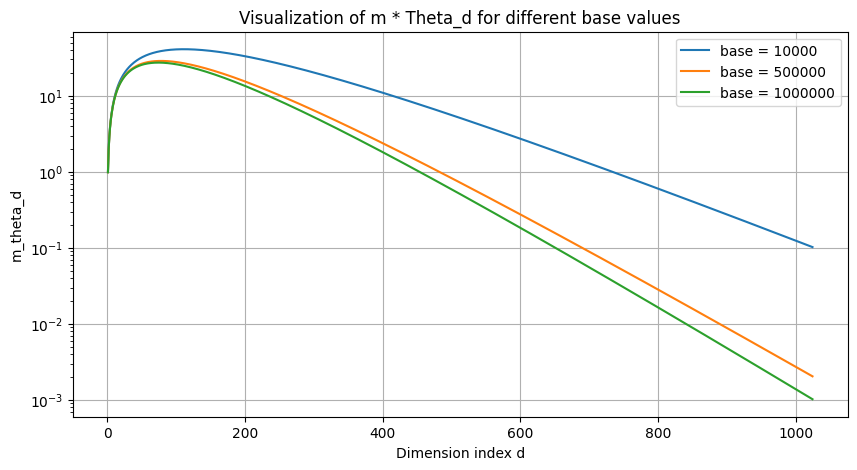

In [ ]:
import numpy as np
# 4k
# 设置参数
base = 10000  # 将base设为大于10000的值
D = 2048
d = np.arange(1, D//2 + 1)  # 从1到D/2
m = np.arange(1, D//2 + 1)

# 不同的base值
bases = [10000, 500000, 1000000]

# 为每个base值计算theta_d
plt.figure(figsize=(10, 5))

for base in bases:
    theta_d = base ** (-2 * d / D)
    m_theta_d = m * theta_d
    plt.plot(d, m_theta_d, label=f'base = {base}')

plt.xlabel('Dimension index d')
plt.ylabel('m_theta_d')
plt.title('Visualization of m * Theta_d for different base values')
plt.grid(True)
plt.yscale('log')
plt.legend()
plt.show()

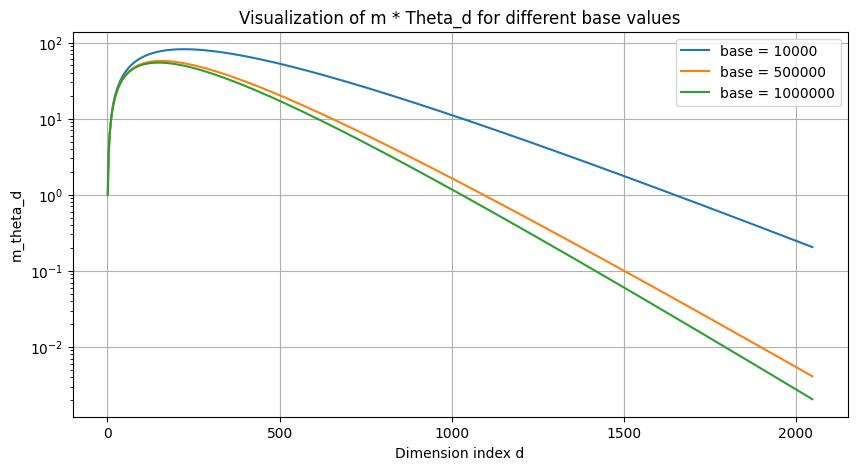

In [13]:
import numpy as np
# 4k
# 设置参数
base = 10000  # 将base设为大于10000的值
D = 4096
d = np.arange(1, D//2 + 1)  # 从1到D/2
m = np.arange(1, D//2 + 1)

# 不同的base值
bases = [10000, 500000, 1000000]

# 为每个base值计算theta_d
plt.figure(figsize=(10, 5))

for base in bases:
    theta_d = base ** (-2 * d / D)
    m_theta_d = m * theta_d
    plt.plot(d, m_theta_d, label=f'base = {base}')

plt.xlabel('Dimension index d')
plt.ylabel('m_theta_d')
plt.title('Visualization of m * Theta_d for different base values')
plt.grid(True)
plt.yscale('log')
plt.legend()
plt.show()

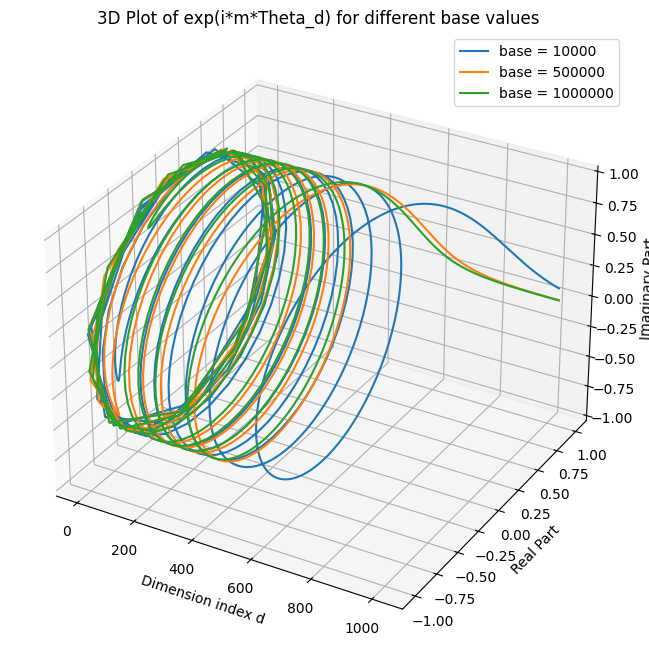

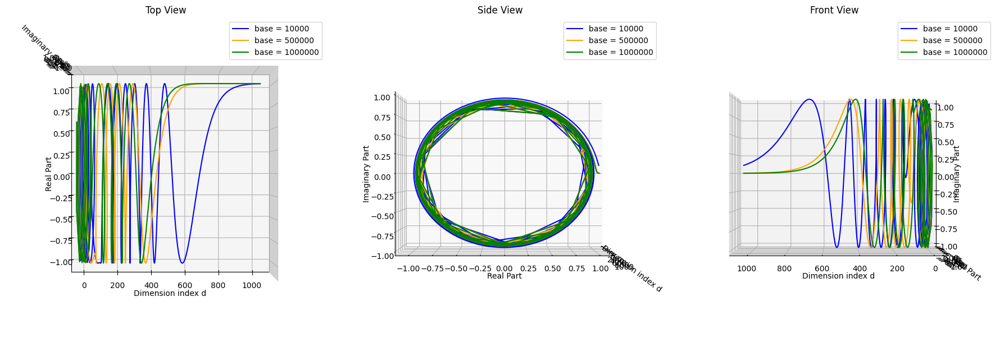

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
# 4K
# 设置参数
D = 2048
d = np.arange(1, 81920//2 + 1)  # 从1到D/2
m = np.arange(1, 81920//2 + 1)  # 同样长度的 m

# 不同的base值
bases = [10000, 500000, 1000000]

# 创建三维图
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# 为每个base值计算theta_d并绘制exp(i*m*theta_d)
for base in bases:
    theta_d = base ** (-2 * d / D)
    m_theta_d = m * theta_d
    exp_i_x = np.exp(1j * m_theta_d)  # 计算复数指数
    ax.plot(d[:1024], np.real(exp_i_x)[:1024], np.imag(
        exp_i_x)[:1024], label=f'base = {base}')  # 绘制实部和虚部

ax.set_xlabel('Dimension index d')
ax.set_ylabel('Real Part')
ax.set_zlabel('Imaginary Part')
ax.set_title('3D Plot of exp(i*m*Theta_d) for different base values')
ax.legend()

plt.show()

# 创建图像
fig = plt.figure(figsize=(18, 6))

# 创建三个独立的坐标轴对象
ax1 = fig.add_subplot(1, 3, 1, projection='3d')
ax2 = fig.add_subplot(1, 3, 2, projection='3d')
ax3 = fig.add_subplot(1, 3, 3, projection='3d')

# 绘制三视图
colors = ['b', 'orange', 'g']  # 不同颜色的曲线
for i, base in enumerate(bases):
    theta_d = base ** (-2 * d / D)
    m_theta_d = m * theta_d
    exp_i_x = np.exp(1j * m_theta_d)  # 计算复数指数

    # 顶视图 (Top View)
    ax1.plot(d[:1024], np.real(exp_i_x)[:1024], np.imag(exp_i_x)
             [:1024], label=f'base = {base}', color=colors[i])
    ax1.view_init(elev=90, azim=-90)
    ax1.set_title('Top View')
    ax1.set_xlabel('Dimension index d')
    ax1.set_ylabel('Real Part')
    ax1.set_zlabel('Imaginary Part')

    # 侧视图 (Side View)
    ax2.plot(d[:1024], np.real(exp_i_x)[:1024], np.imag(exp_i_x)
             [:1024], label=f'base = {base}', color=colors[i])
    ax2.view_init(elev=0, azim=0)
    ax2.set_title('Side View')
    ax2.set_xlabel('Dimension index d')
    ax2.set_ylabel('Real Part')
    ax2.set_zlabel('Imaginary Part')

    # 前视图 (Front View)
    ax3.plot(d[:1024], np.real(exp_i_x)[:1024], np.imag(exp_i_x)
             [:1024], label=f'base = {base}', color=colors[i])

    ax3.view_init(elev=0, azim=90)
    ax3.set_title('Front View')
    ax3.set_xlabel('Dimension index d')
    ax3.set_ylabel('Real Part')
    ax3.set_zlabel('Imaginary Part')

# 添加图例
ax1.legend()
ax2.legend()
ax3.legend()

plt.tight_layout()
plt.show()

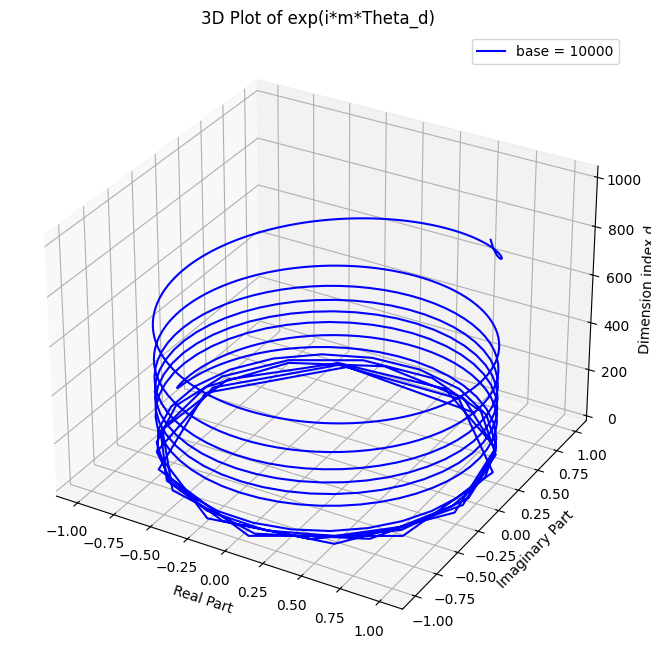

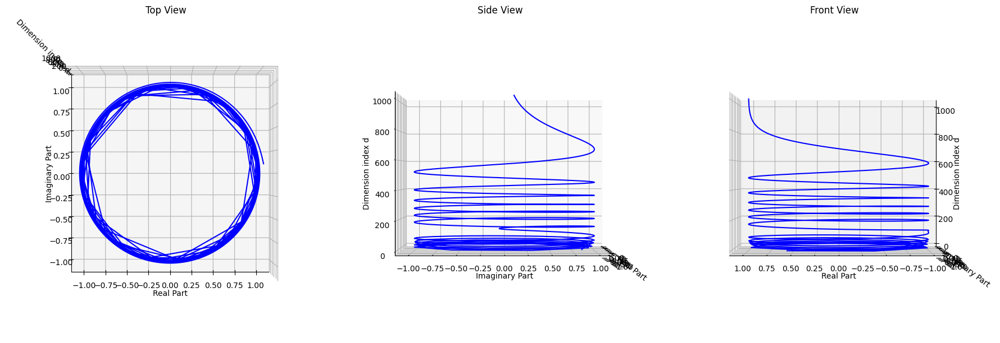

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
D = 2048
d = np.arange(1, 81920//2 + 1)  # 从1到D/2
m = np.arange(1, 81920//2 + 1)  # 同样长度的 m
base = 10000  # Base value

# 计算theta_d并绘制exp(i*m*theta_d)
theta_d = base ** (-2 * d / D)
m_theta_d = m * theta_d
exp_i_x = np.exp(1j * m_theta_d)  # 计算复数指数
# 创建三维图
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# 将实部和虚部作为XY坐标，将d作为Z坐标
ax.plot(np.real(exp_i_x)[:1024], np.imag(exp_i_x)[
        :1024], d[:1024], color='blue', label=f'base = {base}')

ax.set_xlabel('Real Part')
ax.set_ylabel('Imaginary Part')
ax.set_zlabel('Dimension index d')
ax.set_title('3D Plot of exp(i*m*Theta_d)')

plt.legend()
plt.show()
# 创建图像
fig = plt.figure(figsize=(18, 6))

# 顶视图 (Top View)
ax1 = fig.add_subplot(131, projection='3d')
ax1.plot(np.real(exp_i_x)[:1024], np.imag(
    exp_i_x)[:1024], d[:1024], color='blue')
ax1.view_init(elev=90, azim=-90)
ax1.set_title('Top View')
ax1.set_xlabel('Real Part')
ax1.set_ylabel('Imaginary Part')
ax1.set_zlabel('Dimension index d')

# 侧视图 (Side View)
ax2 = fig.add_subplot(132, projection='3d')
ax2.plot(np.real(exp_i_x)[:1024], np.imag(
    exp_i_x)[:1024], d[:1024], color='blue')
ax2.view_init(elev=0, azim=0)
ax2.set_title('Side View')
ax2.set_xlabel('Real Part')
ax2.set_ylabel('Imaginary Part')
ax2.set_zlabel('Dimension index d')

# 前视图 (Front View)
ax3 = fig.add_subplot(133, projection='3d')
ax3.plot(np.real(exp_i_x)[:1024], np.imag(
    exp_i_x)[:1024], d[:1024], color='blue')
ax3.view_init(elev=0, azim=90)
ax3.set_title('Front View')
ax3.set_xlabel('Real Part')
ax3.set_ylabel('Imaginary Part')
ax3.set_zlabel('Dimension index d')

plt.tight_layout()
plt.show()

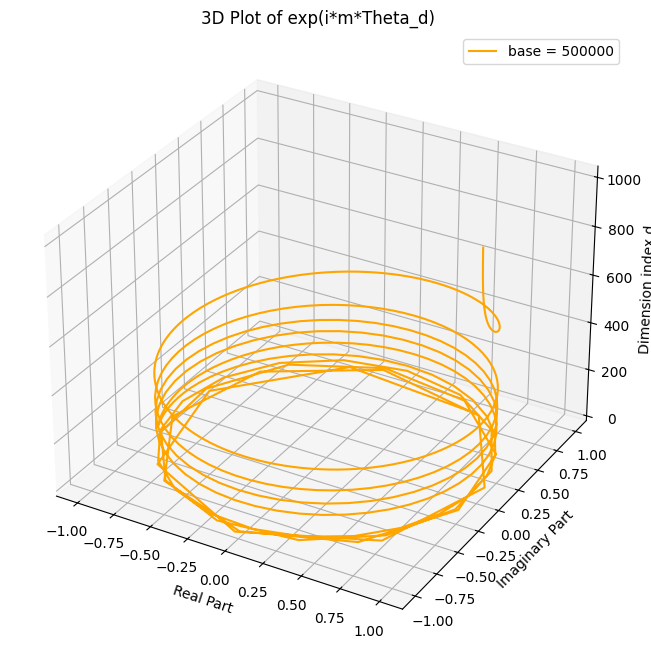

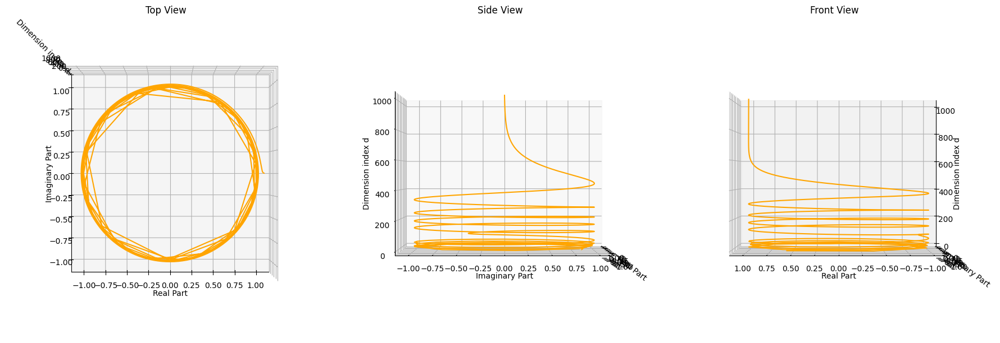

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
D = 2048
d = np.arange(1, 81920//2 + 1)  # 从1到D/2
m = np.arange(1, 81920//2 + 1)  # 同样长度的 m
base = 500000  # Base value

# 计算theta_d并绘制exp(i*m*theta_d)
theta_d = base ** (-2 * d / D)
m_theta_d = m * theta_d
exp_i_x = np.exp(1j * m_theta_d)  # 计算复数指数
# 创建三维图
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# 将实部和虚部作为XY坐标，将d作为Z坐标
ax.plot(np.real(exp_i_x)[:1024], np.imag(exp_i_x)[:1024],
        d[:1024], color='orange', label=f'base = {base}')

ax.set_xlabel('Real Part')
ax.set_ylabel('Imaginary Part')
ax.set_zlabel('Dimension index d')
ax.set_title('3D Plot of exp(i*m*Theta_d)')

plt.legend()
plt.show()
# 创建图像
fig = plt.figure(figsize=(18, 6))

# 顶视图 (Top View)
ax1 = fig.add_subplot(131, projection='3d')
ax1.plot(np.real(exp_i_x)[:1024], np.imag(
    exp_i_x)[:1024], d[:1024], color='orange')
ax1.view_init(elev=90, azim=-90)
ax1.set_title('Top View')
ax1.set_xlabel('Real Part')
ax1.set_ylabel('Imaginary Part')
ax1.set_zlabel('Dimension index d')

# 侧视图 (Side View)
ax2 = fig.add_subplot(132, projection='3d')
ax2.plot(np.real(exp_i_x)[:1024], np.imag(
    exp_i_x)[:1024], d[:1024], color='orange')
ax2.view_init(elev=0, azim=0)
ax2.set_title('Side View')
ax2.set_xlabel('Real Part')
ax2.set_ylabel('Imaginary Part')
ax2.set_zlabel('Dimension index d')

# 前视图 (Front View)
ax3 = fig.add_subplot(133, projection='3d')
ax3.plot(np.real(exp_i_x)[:1024], np.imag(
    exp_i_x)[:1024], d[:1024], color='orange')
ax3.view_init(elev=0, azim=90)
ax3.set_title('Front View')
ax3.set_xlabel('Real Part')
ax3.set_ylabel('Imaginary Part')
ax3.set_zlabel('Dimension index d')

plt.tight_layout()
plt.show()

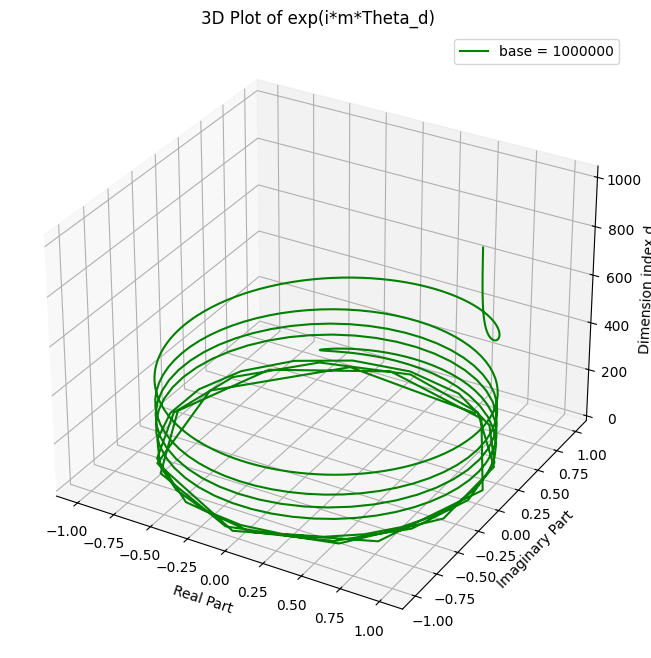

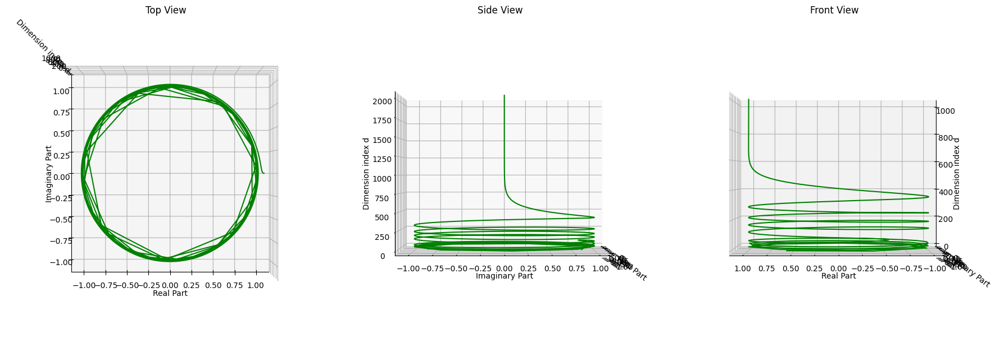

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
D = 2048
d = np.arange(1, 81920//2 + 1)  # 从1到D/2
m = np.arange(1, 81920//2 + 1)  # 同样长度的 m
base = 1000000  # Base value

# 计算theta_d并绘制exp(i*m*theta_d)
theta_d = base ** (-2 * d / D)
m_theta_d = m * theta_d
exp_i_x = np.exp(1j * m_theta_d)  # 计算复数指数
# 创建三维图
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# 将实部和虚部作为XY坐标，将d作为Z坐标
ax.plot(np.real(exp_i_x)[:1024], np.imag(exp_i_x)[:1024],
        d[:1024], color='green', label=f'base = {base}')

ax.set_xlabel('Real Part')
ax.set_ylabel('Imaginary Part')
ax.set_zlabel('Dimension index d')
ax.set_title('3D Plot of exp(i*m*Theta_d)')

plt.legend()
plt.show()
# 创建图像
fig = plt.figure(figsize=(18, 6))

# 顶视图 (Top View)
ax1 = fig.add_subplot(131, projection='3d')
ax1.plot(np.real(exp_i_x)[:1024], np.imag(
    exp_i_x)[:1024], d[:1024],  color='green',)
ax1.view_init(elev=90, azim=-90)
ax1.set_title('Top View')
ax1.set_xlabel('Real Part')
ax1.set_ylabel('Imaginary Part')
ax1.set_zlabel('Dimension index d')

# 侧视图 (Side View)
ax2 = fig.add_subplot(132, projection='3d')
ax2.plot(np.real(exp_i_x)[:2048], np.imag(
    exp_i_x)[:2048], d[:2048],  color='green',)
ax2.view_init(elev=0, azim=0)
ax2.set_title('Side View')
ax2.set_xlabel('Real Part')
ax2.set_ylabel('Imaginary Part')
ax2.set_zlabel('Dimension index d')

# 前视图 (Front View)
ax3 = fig.add_subplot(133, projection='3d')
ax3.plot(np.real(exp_i_x)[:1024], np.imag(
    exp_i_x)[:1024], d[:1024],  color='green',)
ax3.view_init(elev=0, azim=90)
ax3.set_title('Front View')
ax3.set_xlabel('Real Part')
ax3.set_ylabel('Imaginary Part')
ax3.set_zlabel('Dimension index d')

plt.tight_layout()
plt.show()

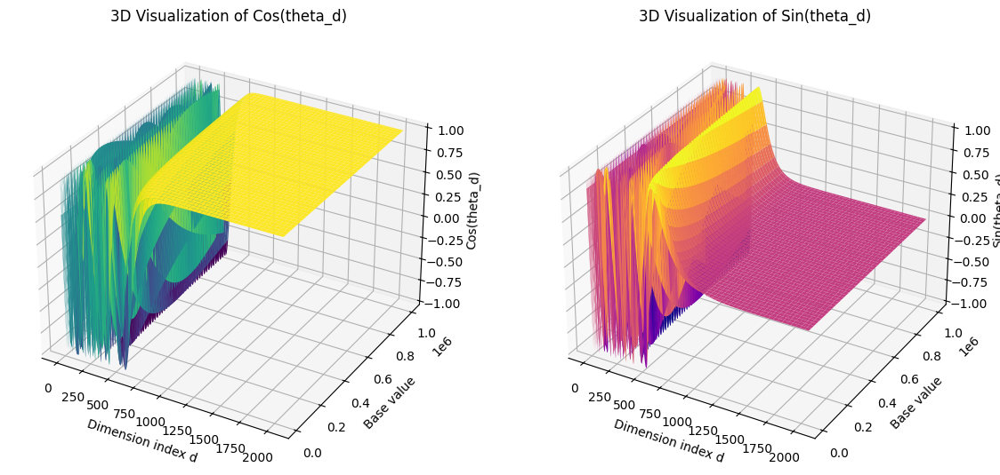

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt

# 设置参数
D = 2048
base_values = np.linspace(10000, 1000000, 100)  # 从10000到1000000的base值
d = np.arange(1, 4096//2 + 1)  # 从1到D/2

# 创建一个三维网格，d和base_values
D_mesh, Base_mesh = np.meshgrid(d, base_values)
m = np.arange(1, 4096//2 + 1)
# 计算对应的theta值
Theta_mesh = m * Base_mesh ** (-2 * D_mesh / D)

# 计算cos和sin值
Cos_mesh = np.cos(Theta_mesh[:1024])
Sin_mesh = np.sin(Theta_mesh[:1024])

# 绘制cos(theta_d)
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(121, projection='3d')
surf = ax.plot_surface(D_mesh[:1024], Base_mesh[:1024],
                       Cos_mesh[:1024], cmap='viridis')
ax.set_xlabel('Dimension index d')
ax.set_ylabel('Base value')
ax.set_zlabel('Cos(theta_d)')
ax.set_title('3D Visualization of Cos(theta_d)')

# 绘制sin(theta_d)
ax2 = fig.add_subplot(122, projection='3d')
surf2 = ax2.plot_surface(
    D_mesh[:1024], Base_mesh[:1024], Sin_mesh[:1024], cmap='plasma')
ax2.set_xlabel('Dimension index d')
ax2.set_ylabel('Base value')
ax2.set_zlabel('Sin(theta_d)')
ax2.set_title('3D Visualization of Sin(theta_d)')

plt.show()

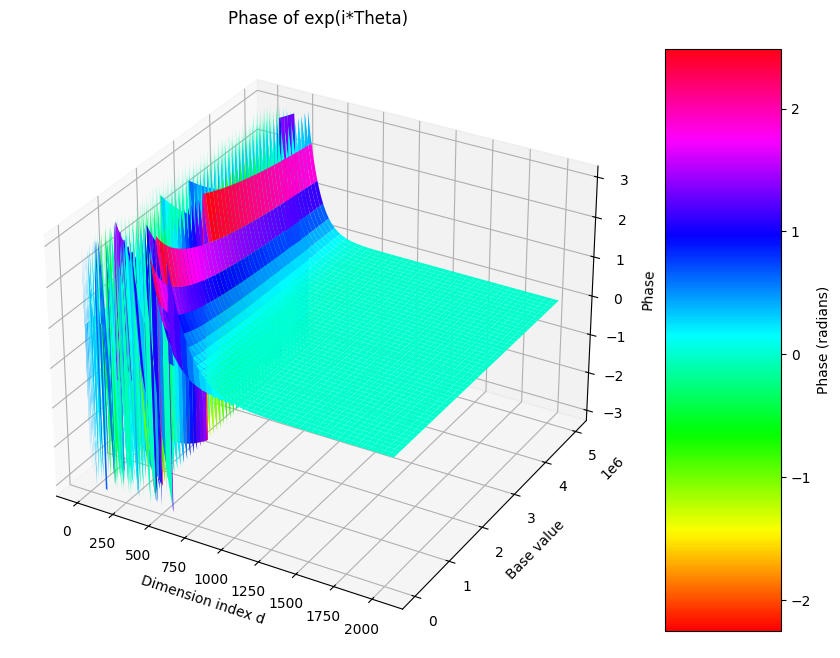

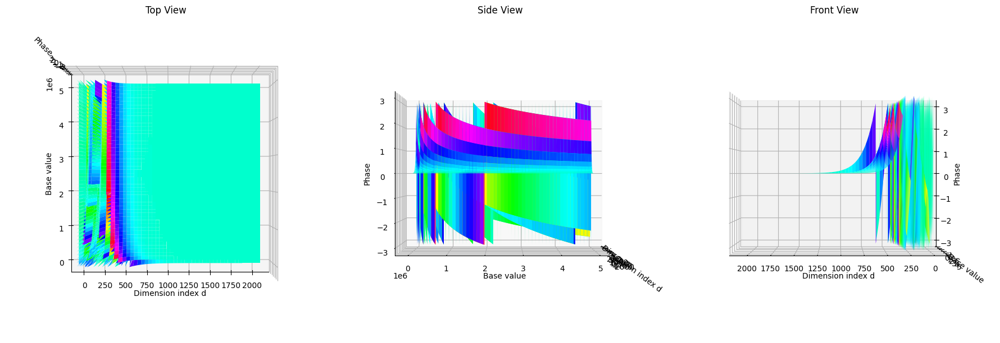

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
D = 2048
base_values = np.linspace(10000, 5000000, 1000)  # 从10000到1000000的base值
d = np.arange(1, 4096//2 + 1)  # 从1到D/2

# 创建一个三维网格，d和base_values
D_mesh, Base_mesh = np.meshgrid(d, base_values)
m = np.arange(1, 4096//2 + 1)

# 计算对应的theta值
Theta_mesh = m * Base_mesh ** (-2 * D_mesh / D)
# 计算 e^{i*theta}
exp_i_theta = np.exp(1j * Theta_mesh)

#  e^{i\theta}的模（幅度）和相位作为另外两个变量展示。
# 由于 e^{i\theta}的模总是 1
# （因为 e^{i\theta}在复平面上表示单位圆上的点），我们只需可视化相位即可，通常这通过颜色映射来表示。

# 提取实部和虚部用于绘图
real_part = np.real(exp_i_theta)
imag_part = np.imag(exp_i_theta)

# 获取相位信息
phase = np.angle(exp_i_theta)

# 绘制三维图
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# 使用相位作为颜色映射
surf = ax.plot_surface(D_mesh, Base_mesh, phase, cmap='hsv', edgecolor='none')
ax.set_title('Phase of exp(i*Theta)')
ax.set_xlabel('Dimension index d')
ax.set_ylabel('Base value')
ax.set_zlabel('Phase')
cbar = fig.colorbar(surf, ax=ax, aspect=5)
cbar.set_label('Phase (radians)')

plt.show()


# 创建图像
fig = plt.figure(figsize=(18, 6))

# 顶视图 (Top View)
ax1 = fig.add_subplot(131, projection='3d')
surf = ax1.plot_surface(D_mesh, Base_mesh, phase, cmap='hsv')
ax1.view_init(elev=90, azim=-90)  # 只改变视角
ax1.set_title('Top View')
ax1.set_xlabel('Dimension index d')
ax1.set_ylabel('Base value')
ax1.set_zlabel('Phase')

# 侧视图 (Side View)
ax2 = fig.add_subplot(132, projection='3d')
surf2 = ax2.plot_surface(D_mesh, Base_mesh, phase, cmap='hsv')
ax2.view_init(elev=0, azim=0)  # 只改变视角
ax2.set_title('Side View')
ax2.set_xlabel('Dimension index d')
ax2.set_ylabel('Base value')
ax2.set_zlabel('Phase')

# 前视图 (Front View)
ax3 = fig.add_subplot(133, projection='3d')
surf3 = ax3.plot_surface(D_mesh, Base_mesh, phase, cmap='hsv')
ax3.view_init(elev=0, azim=90)  # 只改变视角
ax3.set_title('Front View')
ax3.set_xlabel('Dimension index d')
ax3.set_ylabel('Base value')
ax3.set_zlabel('Phase')

plt.tight_layout()
plt.show()

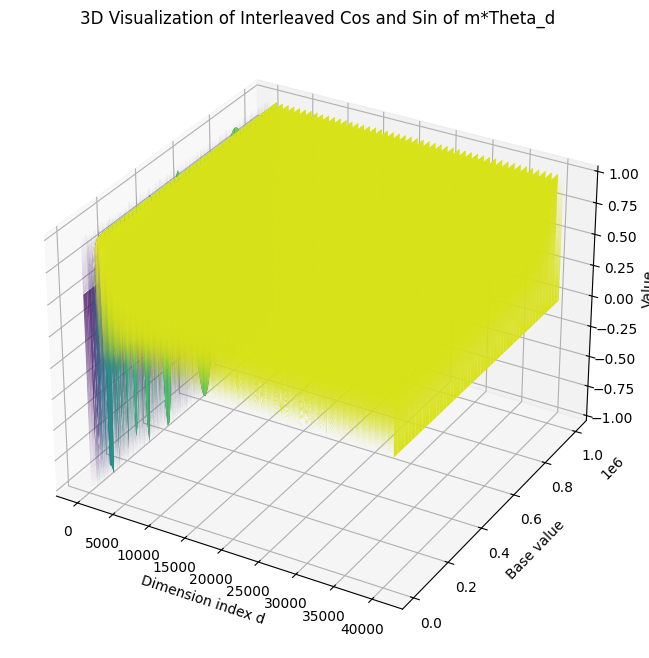

KeyboardInterrupt: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
D = 2048
base_values = np.linspace(10000, 1000000, 100)  # 从10000到1000000的100个base值
d = np.arange(1, 81920//2 + 1)  # 从1到D/2
m = np.arange(1, 81920//2 + 1)  # 确保m的长度与d匹配

# 创建一个三维网格，d和base_values
D_mesh, Base_mesh = np.meshgrid(d, base_values)

# 计算对应的theta值
Theta_mesh = m*Base_mesh ** (-2 * D_mesh / D)

# 初始化用于存放cos和sin值的数组
Values_mesh = np.zeros_like(Theta_mesh)

# 扩展m以匹配Theta_mesh的形状
m_extended = np.tile(m, (Theta_mesh.shape[0], 1))

# 为奇数索引d计算cos值，为偶数索引d计算sin值
Values_mesh[:, 0::2] = np.cos(
    m_extended[:, 0::2] * Theta_mesh[:, 0::2])  # 偶数索引列
Values_mesh[:, 1::2] = np.sin(
    m_extended[:, 1::2] * Theta_mesh[:, 1::2])  # 奇数索引列

# 绘制三维图
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(D_mesh, Base_mesh, Values_mesh, cmap='viridis')

ax.set_xlabel('Dimension index d')
ax.set_ylabel('Base value')
ax.set_zlabel('Value')
ax.set_title('3D Visualization of Interleaved Cos and Sin of m*Theta_d')

plt.show()


fig = plt.figure(figsize=(18, 6))

# 顶视图 (Top View)
ax1 = fig.add_subplot(131, projection='3d')
ax1.plot_surface(D_mesh, Base_mesh, Values_mesh, cmap='viridis')
ax1.view_init(elev=90, azim=-90)
ax1.set_title('Top View')
ax1.set_xlabel('Dimension index d')
ax1.set_ylabel('Base value')
ax1.set_zlabel('Value')

# 侧视图 (Side View)
ax2 = fig.add_subplot(132, projection='3d')
ax2.plot_surface(D_mesh, Base_mesh, Values_mesh, cmap='viridis')
ax2.view_init(elev=0, azim=0)
ax2.set_title('Side View')
ax2.set_xlabel('Dimension index d')
ax2.set_ylabel('Base value')
ax2.set_zlabel('Value')

# 前视图 (Front View)
ax3 = fig.add_subplot(133, projection='3d')
ax3.plot_surface(D_mesh, Base_mesh, Values_mesh, cmap='viridis')
ax3.view_init(elev=0, azim=90)
ax3.set_title('Front View')
ax3.set_xlabel('Dimension index d')
ax3.set_ylabel('Base value')
ax3.set_zlabel('Value')

plt.tight_layout()
plt.show()

# NTK RoPE

Hidden_Size = 2048

Max_emb = 32768

## scale

```
d = np.arange(1, 128000//2 + 1)
for m in d:
    if m > Max_emb:
        s =  m  / Max_emb
        m *= ( 1 / s )
```

## NTK

```
d = np.arange(1, 128000//2 + 1)
for m in d:
    if m > Max_emb:
        s =  (m- Max_emb)  / Max_emb
        m *= ( 1 / s )
        base *= s**( Hidden_Size / (Hidden_Size - 2))
        theta = base ** (-2 * m / Hidden_Size)
```


[1.00003052 1.00006104 1.00009155 ... 2.49993896 2.49996948 2.5       ]
[9.99969483e-01 1.99987794e+00 2.99972537e+00 ... 1.63835000e+04
 1.63837500e+04 1.63840000e+04]
[16384.24999619 16384.49998474 16384.74996567 ... 23405.55101756
 23405.63265235 23405.71428571]
[1.00903504e+00 1.00000000e+00 1.00000000e+00 ... 1.01815172e-64
 1.01815172e-64 1.00903504e-64]
[1.00903504e-064 1.00000000e-064 1.00000000e-064 ... 1.01815172e-160
 1.01815172e-160 1.00903504e-160]
[0.00000000e+00 0.00000000e+00 1.00000000e+00 ... 8.33968075e-61
 8.33968075e-61 8.26601509e-61]
[8.26601509e-061 8.19200000e-061 8.19200000e-061 ... 1.19144114e-156
 1.19144114e-156 1.18077281e-156]
[1.        +0.00000000e+00j 1.        +0.00000000e+00j
 0.54030231+8.41470985e-01j ... 1.        +8.33968075e-61j
 1.        +8.33968075e-61j 1.        +8.26601509e-61j]
[1.+8.26601509e-061j 1.+8.19200000e-061j 1.+8.19200000e-061j ...
 1.+1.19144114e-156j 1.+1.19144114e-156j 1.+1.18077281e-156j]
[1.01289727e+00 1.00000000e+00 1.0000

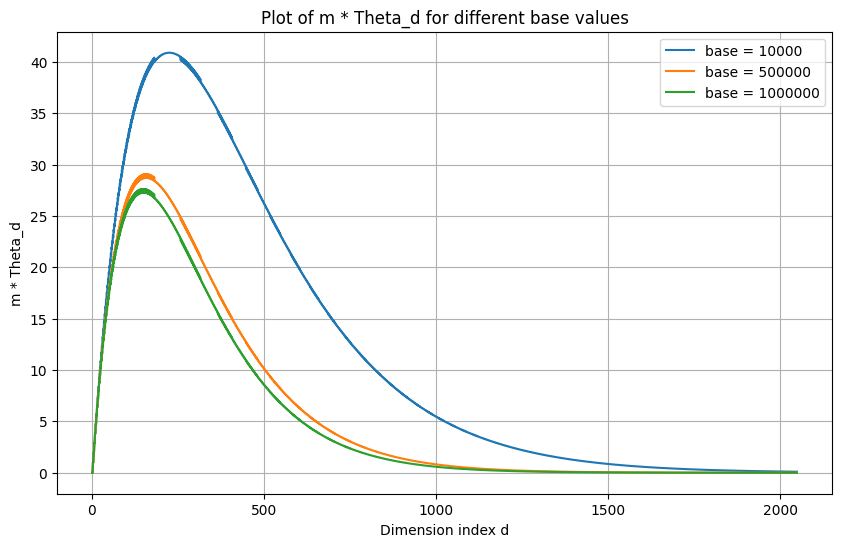

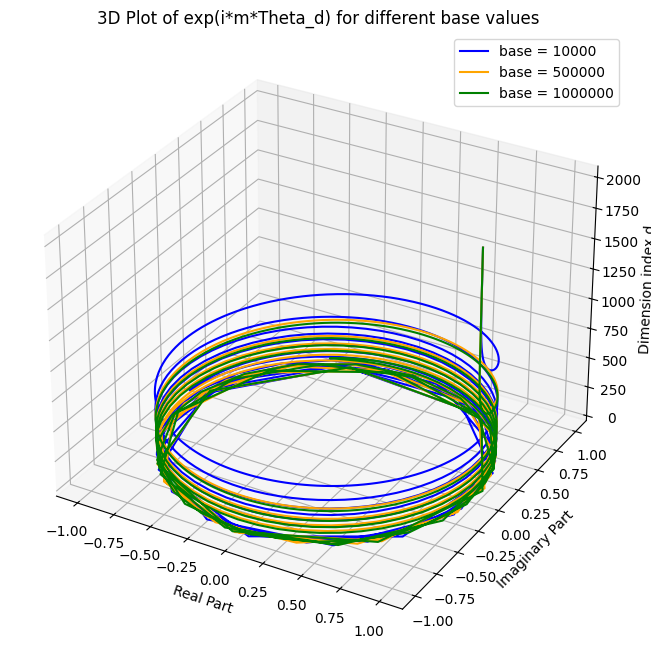

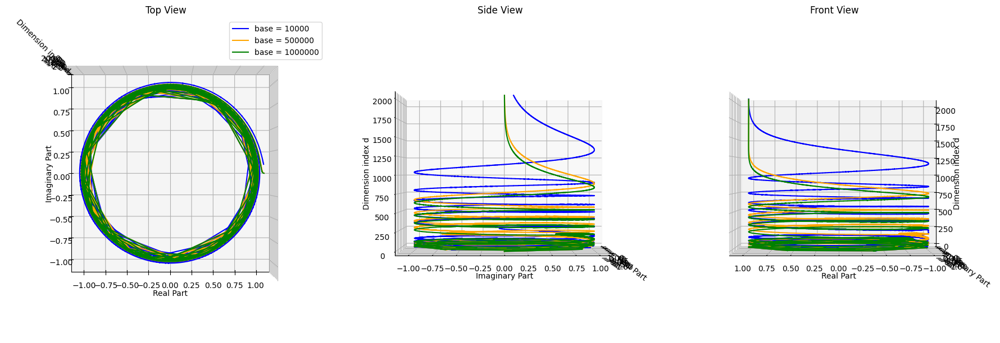

In [ ]:
# Scale
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
D = 2048
Hidden_Size = 2048
Max_emb = 32768

# 根据需求调整m的定义范围
d = np.arange(1, 81920 + 1)  # 从1到D/2
m = np.arange(1, 81920 + 1)  # 同样长度的 m

# Scale adjustment for m
s = np.maximum(0, m / Max_emb)  # Compute scale only for m > Max_emb
print(s[32768:])
m_adjusted = m / (1 + s)  # Adjust m based on the scale
print(m_adjusted[:32768])
print(m_adjusted[32768:])


# Base values
bases = [10000, 500000, 1000000]
exp_i_x_list = []
# 创建图形
plt.figure(figsize=(10, 6))

# 循环不同的base值，并计算theta_d及绘制m_theta_d
for base in bases:
    theta_d = base ** (-2 * (d // 2-1) / D)
    print(theta_d[:32768])
    print(theta_d[32768:])
    m_theta_d = m_adjusted // 2 * theta_d
    print(m_theta_d[:32768])
    print(m_theta_d[32768:])
    plt.plot(d[:2048], m_theta_d[:2048], label=f'base = {base}')

    exp_i_x = np.exp(1j * m_theta_d)  # 计算复数指数
    exp_i_x_list.append(exp_i_x)
    print(exp_i_x[:32768])
    print(exp_i_x[32768:])


plt.xlabel('Dimension index d')
plt.ylabel('m * Theta_d')
plt.title('Plot of m * Theta_d for different base values')
plt.legend()
plt.grid(True)
plt.show()

# 创建三维图形对象
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# 循环处理不同的基底值，并计算和绘制exp(i*m*theta_d)
colors = ['b', 'orange', 'g']  # 不同颜色的曲线
for base, color in zip(bases, colors):
    theta_d = base ** (-2 * m / D)  # Correct formula for theta_d calculation
    m_theta_d = m_adjusted * theta_d
    exp_i_x = np.exp(1j * m_theta_d)  # Calculate the complex exponential

    # Plot the real part, imaginary part against the dimension index d

    ax.plot(np.real(exp_i_x)[:2048], np.imag(exp_i_x)[
            :2048], d[:2048], label=f'base = {base}', color=color)

# Label the axes
ax.set_xlabel('Real Part')
ax.set_ylabel('Imaginary Part')
ax.set_zlabel('Dimension index d')
ax.set_title('3D Plot of exp(i*m*Theta_d) for different base values')

ax.legend()
plt.show()

# 创建三视图
fig = plt.figure(figsize=(18, 6))

# 绘制三视图
views = [(90, -90), (0, 0), (0, 90)]
titles = ['Top View', 'Side View', 'Front View']
colors = ['b', 'orange', 'g']  # 不同颜色的曲线

for i in range(3):
    ax = fig.add_subplot(1, 3, i+1, projection='3d')
    for j, exp_i_x in enumerate(exp_i_x_list):
        ax.plot(np.real(exp_i_x)[:2048], np.imag(exp_i_x)[
                :2048], d[:2048], label=f'base = {bases[j]}', color=colors[j])

    ax.view_init(*views[i])
    ax.set_title(titles[i])
    ax.set_xlabel('Real Part')
    ax.set_ylabel('Imaginary Part')
    ax.set_zlabel('Dimension index d')
    if i == 0:
        ax.legend()

plt.tight_layout()
plt.show()

[0.         0.         0.         ... 1.49993896 1.49996948 1.5       ]
[1.00000000e+00 2.00000000e+00 3.00000000e+00 ... 5.46142223e+04
 5.46137778e+04 5.46133333e+04]
[1.00000000e+00 2.00000000e+00 3.00000000e+00 ... 5.46142223e+04
 5.46137778e+04 5.46133333e+04]
[ True  True  True ...  True  True  True]
[9.86598896e-001 9.73377381e-001 9.60333049e-001 ... 1.83345614e-223
 1.83912617e-223 1.84481349e-223]


/tmp/ipykernel_1981108/1595787264.py:37: RuntimeWarning: overflow encountered in power
  theta_d[mask] = (base * scale_factor) ** (-2 * m_adjusted[mask] / D)


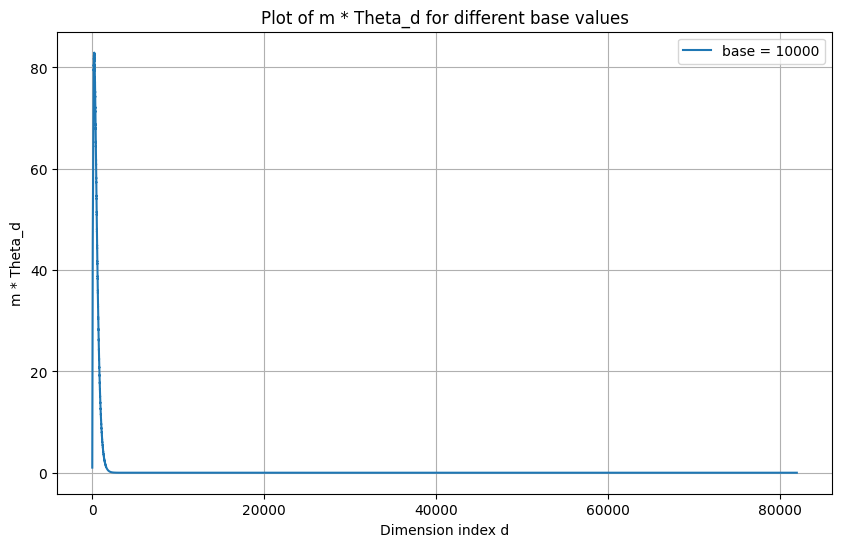

In [ ]:
# scale NTK
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
Hidden_Size = 2048
Max_emb = 32768
D = Hidden_Size

# 根据需求调整m的定义范围
d = np.arange(1, 81920 + 1)
# Ensure m is a float to handle division correctly
m = np.arange(1, 81920 + 1, dtype=float)
m_adjusted = np.copy(m)
# Scale adjustment for m and conditional base adjustment
s = np.zeros_like(m, dtype=float)
mask = m > Max_emb
s[mask] = (m[mask] - Max_emb) / Max_emb
print(s)
m[mask] *= 1 / s[mask]
print(m)

# Prepare lists for plotting
exp_i_x_list = []
adjusted_bases = bases.copy()

m_adjusted[mask] *= 1 / s[mask]
print(m_adjusted)
print(m_adjusted == m)
# Base values
bases = np.array([10000, 500000, 1000000], dtype=float)
bases = np.array([10000])
# 计算theta_d及绘制m_theta_d
plt.figure(figsize=(10, 6))
for base in bases:
    scale_factor = np.power(s[mask], Hidden_Size / (Hidden_Size - 2))
    theta_d[mask] = (base * scale_factor) ** (-2 * m_adjusted[mask] / D)
    print(theta_d)  # 这里会发生上溢
    theta_d = base ** (-2 * (d//2-1) / D)
    m_theta_d = m_adjusted * theta_d
    # plt.plot(d[32768:], m_theta_d[32768:], label=f'base = {base}')
    plt.plot(d, m_theta_d, label=f'base = {base}')
    # plt.plot(d[32768:40077], m_theta_d[32768:40077], label=f'base = {base}')
plt.xlabel('Dimension index d')
plt.ylabel('m * Theta_d')
plt.title('Plot of m * Theta_d for different base values')
plt.legend()
plt.grid(True)
plt.show()
# # Plot setup
# plt.figure(figsize=(10, 6))

# # Adjust bases conditionally and calculate exp(i*theta_d)
# for i, base in enumerate(bases):
#     # Adjust base if necessary
#     if np.any(mask):
#         adjusted_base = base * np.power(s[mask], Hidden_Size / (Hidden_Size - 2)).mean()  # Adjust base using the mean scale factor

#         adjusted_bases[i] = adjusted_base

#     else:
#         adjusted_base = base

#     theta_d = adjusted_base ** (-2 * m / D)
#     m_theta_d = m * theta_d
#     plt.plot(d, m_theta_d, label=f'base = {base}')
# plt.xlabel('Dimension index d')
# plt.ylabel('m * Theta_d')
# plt.title('Plot of m * Theta_d for different base values')
# plt.legend()
# plt.grid(True)
# plt.show()
# plt.figure(figsize=(10, 6))

# # Adjust bases conditionally and calculate exp(i*theta_d)
# for i, base in enumerate(bases):
#     # Adjust base if necessary
#     if np.any(mask):
#         adjusted_base = base * np.power(s[mask], Hidden_Size / (Hidden_Size - 2)).mean()  # Adjust base using the mean scale factor
#         adjusted_bases[i] = adjusted_base

#     else:
#         adjusted_base = base
#     print(adjusted_bases)
#     theta_d = adjusted_base ** (-2 * m / D)
#     m_theta_d = m * theta_d

#     exp_i_x = np.exp(1j * m_theta_d)  # Calculate the complex exponential
#     exp_i_x_list.append(exp_i_x)
#     plt.plot(d[:2048], np.real(exp_i_x)[:2048], label=f'base = {base} 超过max embed之后的adjusted base =  {adjusted_base:.2f}')

# plt.xlabel('Dimension index d')
# plt.ylabel('Real Part of exp(i*theta_d)')
# plt.title('Real Part of exp(i*theta_d) for adjusted base values')
# plt.legend()
# plt.grid(True)
# plt.show()

# # 3D Visualization of complex exponential values
# fig = plt.figure(figsize=(12, 8))
# ax = fig.add_subplot(111, projection='3d')
# colors = ['b', 'orange', 'g']
# for i, exp_i_x in enumerate(exp_i_x_list):
#     ax.plot(np.real(exp_i_x)[:2048], np.imag(exp_i_x)[:2048], d[:2048], label=f'base = {base} 超过max embed之后的adjusted base = {adjusted_bases[i]:.2f}', color=colors[i])

# ax.set_xlabel('Real Part')
# ax.set_ylabel('Imaginary Part')
# ax.set_zlabel('Dimension index d')
# ax.set_title('3D Plot of exp(i*m*Theta_d) for different adjusted base values')
# ax.legend()
# plt.show()

[ 8.99447302e-03 -0.00000000e+00 -0.00000000e+00 ... -1.60342715e+02
 -1.60343366e+02 -1.60344018e+02]


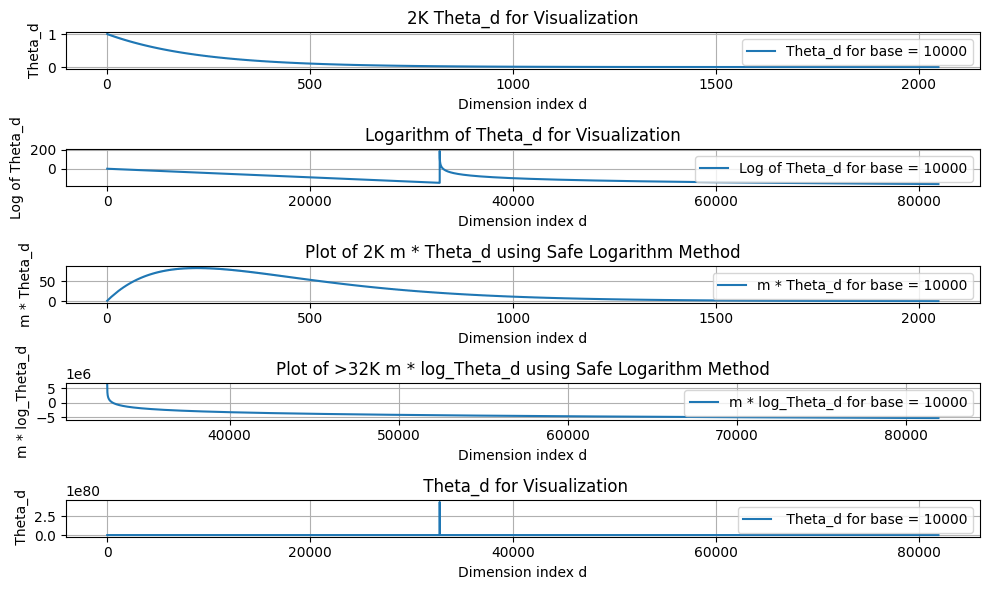

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 设置参数
Hidden_Size = 2048
Max_emb = 32768
D = Hidden_Size

# Generate m and d
d = np.arange(1, 81920 + 1)
m = np.arange(1, 81920 + 1, dtype=float)

# Prepare scaling for m > Max_emb
s = np.zeros_like(m, dtype=float)
mask = m > Max_emb
s[mask] = m[mask] / Max_emb
m_adjusted = np.copy(m)
m_adjusted[mask] *= 1 / (1 + s[mask])

# Base values, just using one for simplicity
bases = np.array([10000])

# Start plotting setup
plt.figure(figsize=(10, 6))

# Calculate and plot
for base in bases:
    # Compute log(theta_d) to manage scale and prevent overflow
    log_theta_d = np.zeros_like(m)
    # log(theta_d) computation directly
    log_theta_d = -2 * (m_adjusted//2-1) / D * np.log(base)

    if np.any(mask):
        scale_factor = np.power(s[mask], Hidden_Size / (Hidden_Size - 2))
        log_theta_d[mask] += np.log(scale_factor) * (-2 * m_adjusted[mask] / D)
        print(log_theta_d)
    # Convert log_theta_d to theta_d safely
    # Safely convert back only if necessary, within limits
    theta_d[mask] = np.exp(log_theta_d[mask])
    m_theta_d = m_adjusted * theta_d
    m_log_theta_d = m_adjusted * log_theta_d
    # Plot log(theta_d) for better understanding of values
    plt.subplot(5, 1, 1)
    plt.plot(d[:2048], theta_d[:2048], label=f'Theta_d for base = {base}')
    plt.xlabel('Dimension index d')
    plt.ylabel('Theta_d')
    plt.title('2K Theta_d for Visualization')
    plt.legend()
    plt.grid(True)

    # Plot log(theta_d) for better understanding of values
    plt.subplot(5, 1, 2)
    plt.plot(d, log_theta_d, label=f'Log of Theta_d for base = {base}')
    plt.xlabel('Dimension index d')
    plt.ylabel('Log of Theta_d')
    plt.title('Logarithm of Theta_d for Visualization')
    plt.legend()
    plt.grid(True)

    # Plot m * theta_d using log transformation results
    plt.subplot(5, 1, 3)
    plt.plot(d[:2048], m_theta_d[:2048],
             label=f'm * Theta_d for base = {base}')
    plt.xlabel('Dimension index d')
    plt.ylabel('m * Theta_d')
    plt.title('Plot of 2K m * Theta_d using Safe Logarithm Method')
    plt.legend()
    plt.grid(True)

    # Plot m * theta_d using log transformation results
    plt.subplot(5, 1, 4)
    plt.plot(d[32768:], m_log_theta_d[32768:],
             label=f'm * log_Theta_d for base = {base}')
    plt.xlabel('Dimension index d')
    plt.ylabel('m * log_Theta_d')
    plt.title('Plot of >32K m * log_Theta_d using Safe Logarithm Method')
    plt.legend()
    plt.grid(True)
    # Plot log(theta_d) for better understanding of values
    plt.subplot(5, 1, 5)
    plt.plot(d, theta_d, label=f' Theta_d for base = {base}')
    plt.xlabel('Dimension index d')
    plt.ylabel(' Theta_d')
    plt.title(' Theta_d for Visualization')
    plt.legend()
    plt.grid(True)
plt.tight_layout()
plt.show()

/tmp/ipykernel_165503/1010490825.py:84: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


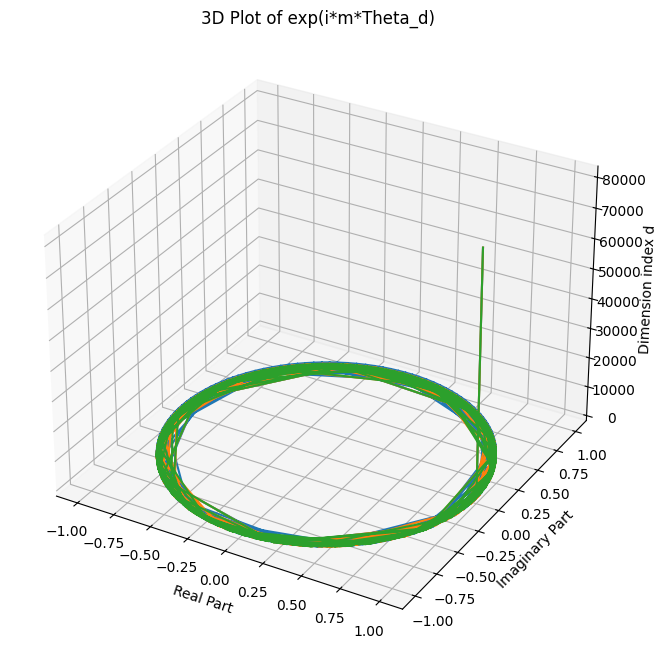

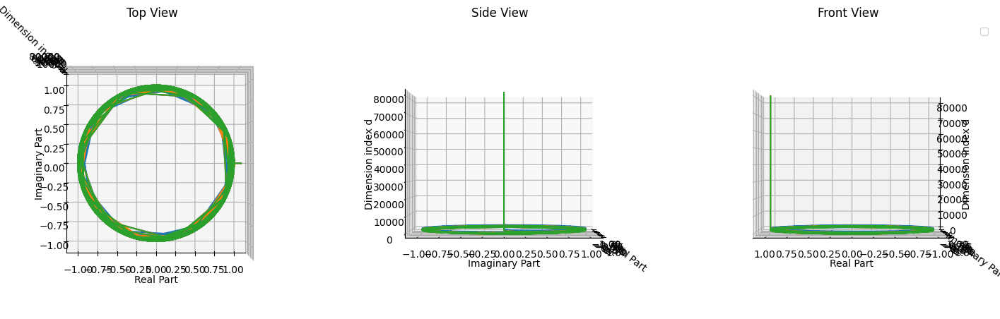

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
Hidden_Size = 2048
Max_emb = 32768
D = Hidden_Size

# Generate m and d
d = np.arange(1, 81920 + 1)
m = np.arange(1, 81920 + 1, dtype=float)

# Prepare scaling for m > Max_emb
s = np.zeros_like(m, dtype=float)
mask = m > Max_emb
s[mask] = m[mask] / Max_emb
m_adjusted = np.copy(m)
m_adjusted[mask] *= 1 / s[mask]

# Base values, just using one for simplicity
bases = np.array([10000, 500000, 1000000])

# Prepare the figure
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

fig1 = plt.figure(figsize=(18, 6))
ax1 = fig1.add_subplot(1, 3, 1, projection='3d')
ax2 = fig1.add_subplot(1, 3, 2, projection='3d')
ax3 = fig1.add_subplot(1, 3, 3, projection='3d')

colors = ['b', 'orange', 'g']   # Colors for different bases

# Calculate and plot
for base in bases:
    log_theta_d = -2 * (m_adjusted // 2 - 1) / D * \
        np.log(base)  # Compute log(theta_d)

    if np.any(mask):
        scale_factor = np.power(s[mask], Hidden_Size / (Hidden_Size - 2))
        log_theta_d[mask] += np.log(scale_factor) * (-2 * m_adjusted[mask] / D)

    # Convert log_theta_d to theta_d safely
    theta_d = np.exp(log_theta_d)
    m_theta_d = m_adjusted * theta_d

    # Calculate the complex exponential e^(i*m*theta)
    exp_i_m_theta = np.exp(1j * m_theta_d)

    # Plot the real and imaginary parts along with the dimension index
    ax.plot(np.real(exp_i_m_theta), np.imag(
        exp_i_m_theta), d, label=f'Base = {base}')

    # Top View
    ax1.plot(np.real(exp_i_m_theta), np.imag(exp_i_m_theta), d)
    ax1.view_init(elev=90, azim=-90)
    ax1.set_title('Top View')
    ax1.set_xlabel('Real Part')
    ax1.set_ylabel('Imaginary Part')
    ax1.set_zlabel('Dimension index d')

    # Side View
    ax2.plot(np.real(exp_i_m_theta), np.imag(exp_i_m_theta), d)
    ax2.view_init(elev=0, azim=0)
    ax2.set_title('Side View')
    ax2.set_xlabel('Real Part')
    ax2.set_ylabel('Imaginary Part')
    ax2.set_zlabel('Dimension index d')

    # Front View
    ax3.plot(np.real(exp_i_m_theta), np.imag(exp_i_m_theta), d)
    ax3.view_init(elev=0, azim=90)
    ax3.set_title('Front View')
    ax3.set_xlabel('Real Part')
    ax3.set_ylabel('Imaginary Part')
    ax3.set_zlabel('Dimension index d')

# Set labels and title
ax.set_xlabel('Real Part')
ax.set_ylabel('Imaginary Part')
ax.set_zlabel('Dimension index d')
ax.set_title('3D Plot of exp(i*m*Theta_d)')

# Show the plot
plt.legend()
plt.show()

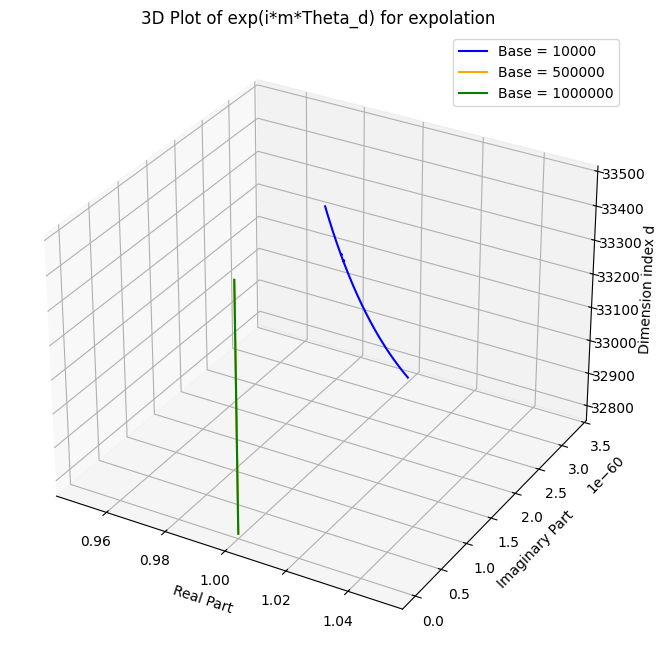

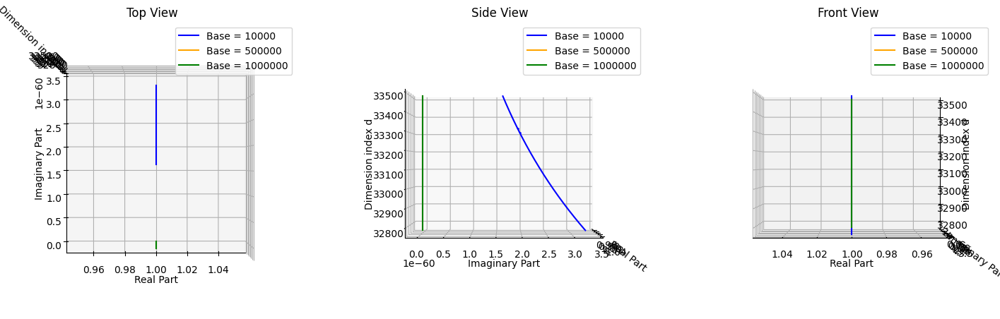

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
Hidden_Size = 2048
Max_emb = 32768
D = Hidden_Size

# Generate m and d
d = np.arange(1, 81920 + 1)
m = np.arange(1, 81920 + 1, dtype=float)

# Prepare scaling for m > Max_emb
s = np.zeros_like(m, dtype=float)
mask = m > Max_emb
s[mask] = np.maximum(1, m[mask] / Max_emb)
m_adjusted = np.copy(m)
m_adjusted[mask] *= 1 / s[mask]  # 这里应该是倒数来的,加了个1

# Base values
bases = np.array([10000, 500000, 1000000])

# Prepare the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

fig1 = plt.figure(figsize=(18, 6))
ax1 = fig1.add_subplot(1, 3, 1, projection='3d')
ax2 = fig1.add_subplot(1, 3, 2, projection='3d')
ax3 = fig1.add_subplot(1, 3, 3, projection='3d')

colors = ['b', 'orange', 'g']   # Colors for different bases

# Calculate and plot
for idx, base in enumerate(bases):
    theta_d = -2 * (m_adjusted // 2 - 1) / D * base
    log_theta_d = -2 * (m_adjusted // 2 - 1) / D * \
        np.log(base)  # Compute log(theta_d)

    if np.any(mask):
        scale_factor = np.power(s[mask], Hidden_Size / (Hidden_Size - 2))
        log_theta_d[mask] += np.log(scale_factor) * (-2 * m_adjusted[mask] / D)

    theta_d = np.exp(log_theta_d)
    m_theta_d = m_adjusted * theta_d

    # Calculate the complex exponential e^(i*m*theta)
    exp_i_m_theta = np.exp(1j * m_theta_d)

    # Plot in the main 3D plot
    ax.plot(np.real(exp_i_m_theta)[32768:33500], np.imag(exp_i_m_theta)[
            32768:33500], d[32768:33500], label=f'Base = {base}', color=colors[idx])

    # Top View
    ax1.plot(np.real(exp_i_m_theta)[32768:33500], np.imag(exp_i_m_theta)[
             32768:33500], d[32768:33500], color=colors[idx])
    ax1.view_init(elev=90, azim=-90)
    ax1.set_title('Top View')
    ax1.set_xlabel('Real Part')
    ax1.set_ylabel('Imaginary Part')
    ax1.set_zlabel('Dimension index d')

    # Side View
    ax2.plot(np.real(exp_i_m_theta)[32768:33500], np.imag(exp_i_m_theta)[
             32768:33500], d[32768:33500], color=colors[idx])
    ax2.view_init(elev=0, azim=0)
    ax2.set_title('Side View')
    ax2.set_xlabel('Real Part')
    ax2.set_ylabel('Imaginary Part')
    ax2.set_zlabel('Dimension index d')

    # Front View
    ax3.plot(np.real(exp_i_m_theta)[32768:33500], np.imag(exp_i_m_theta)[
             32768:33500], d[32768:33500], color=colors[idx])
    ax3.view_init(elev=0, azim=90)
    ax3.set_title('Front View')
    ax3.set_xlabel('Real Part')
    ax3.set_ylabel('Imaginary Part')
    ax3.set_zlabel('Dimension index d')

# Set labels and title for the main plot
ax.set_xlabel('Real Part')
ax.set_ylabel('Imaginary Part')
ax.set_zlabel('Dimension index d')
ax.set_title('3D Plot of exp(i*m*Theta_d) for expolation')
ax.legend()

# Show legends for three views
ax1.legend([f'Base = {base}' for base in bases])
ax2.legend([f'Base = {base}' for base in bases])
ax3.legend([f'Base = {base}' for base in bases])

plt.show()

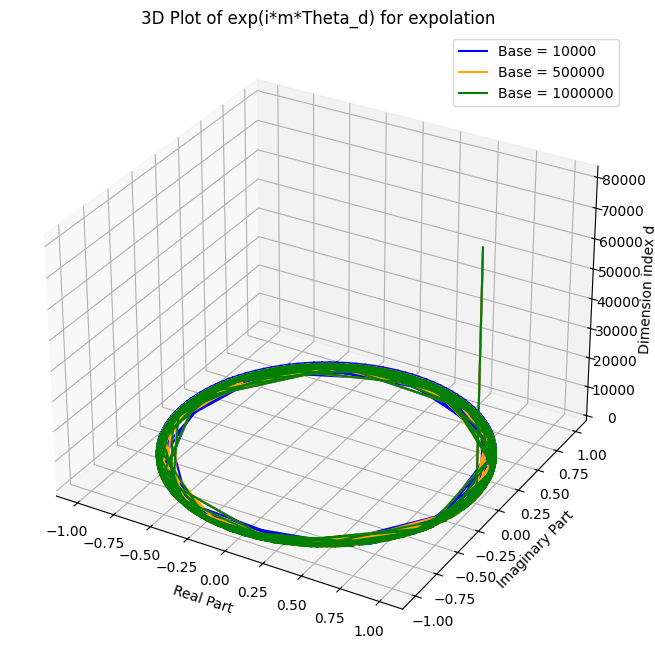

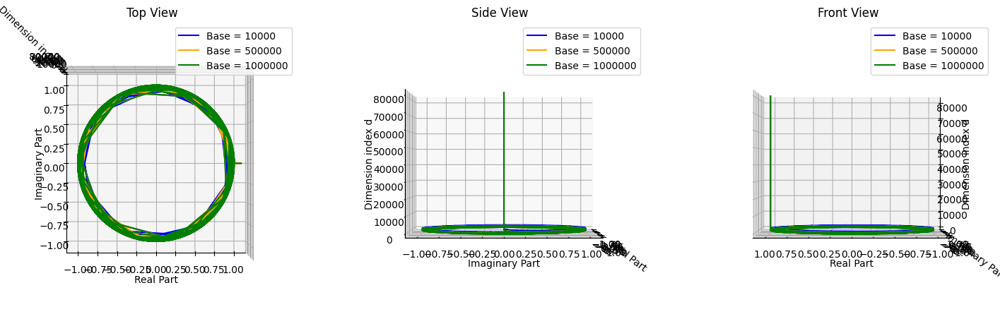

In [ ]:
# Scaled Dynamic NTK?
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 设置参数
Hidden_Size = 2048
Max_emb = 32768
D = Hidden_Size

# Generate m and d
d = np.arange(1, 81920 + 1)
m = np.arange(1, 81920 + 1, dtype=float)

# Prepare scaling for m > Max_emb
s = np.zeros_like(m, dtype=float)
mask = m > Max_emb
s[mask] = np.maximum(1, (m[mask] - Max_emb) / Max_emb)  # 更新比例因子,优雅降级
m_adjusted = np.copy(m)
m_adjusted[mask] *= 1 / (s[mask])

# Base values
bases = np.array([10000, 500000, 1000000])

# Prepare the figures
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

fig1 = plt.figure(figsize=(18, 6))
ax1 = fig1.add_subplot(1, 3, 1, projection='3d')
ax2 = fig1.add_subplot(1, 3, 2, projection='3d')
ax3 = fig1.add_subplot(1, 3, 3, projection='3d')

colors = ['b', 'orange', 'g']   # Colors for different bases

# Calculate and plot
for idx, base in enumerate(bases):
    theta_d = -2 * (m_adjusted // 2 - 1) / D * base
    log_theta_d = -2 * (m_adjusted // 2 - 1) / D * \
        np.log(base)  # Compute log(theta_d)

    if np.any(mask):
        scale_factor = np.power(s[mask], Hidden_Size / (Hidden_Size - 2))
        log_theta_d[mask] += np.log(scale_factor) * (-2 * m_adjusted[mask] / D)

    theta_d = np.exp(log_theta_d)
    m_theta_d = m_adjusted * theta_d

    # Calculate the complex exponential e^(i*m*theta)
    exp_i_m_theta = np.exp(1j * m_theta_d)

    # Plot in the main 3D plot
    ax.plot(np.real(exp_i_m_theta), np.imag(exp_i_m_theta),
            d, label=f'Base = {base}', color=colors[idx])

    # Top View
    ax1.plot(np.real(exp_i_m_theta), np.imag(
        exp_i_m_theta), d, color=colors[idx])
    ax1.view_init(elev=90, azim=-90)
    ax1.set_title('Top View')
    ax1.set_xlabel('Real Part')
    ax1.set_ylabel('Imaginary Part')
    ax1.set_zlabel('Dimension index d')

    # Side View
    ax2.plot(np.real(exp_i_m_theta), np.imag(
        exp_i_m_theta), d, color=colors[idx])
    ax2.view_init(elev=0, azim=0)
    ax2.set_title('Side View')
    ax2.set_xlabel('Real Part')
    ax2.set_ylabel('Imaginary Part')
    ax2.set_zlabel('Dimension index d')

    # Front View
    ax3.plot(np.real(exp_i_m_theta), np.imag(
        exp_i_m_theta), d, color=colors[idx])
    ax3.view_init(elev=0, azim=90)
    ax3.set_title('Front View')
    ax3.set_xlabel('Real Part')
    ax3.set_ylabel('Imaginary Part')
    ax3.set_zlabel('Dimension index d')

# Set labels and title for the main plot
ax.set_xlabel('Real Part')
ax.set_ylabel('Imaginary Part')
ax.set_zlabel('Dimension index d')
ax.set_title('3D Plot of exp(i*m*Theta_d) for expolation')
ax.legend()

# Show legends for three views
ax1.legend([f'Base = {base}' for base in bases])
ax2.legend([f'Base = {base}' for base in bases])
ax3.legend([f'Base = {base}' for base in bases])

plt.show()